<h1 style="font-size:30px;">Introduction to OpenCV DNN Module</h1>

The OpenCV DNN module provides a great place to start your journey in learning about neural networks and deep learning with computer vision. This is because you get access to state-of-the-art models with very few lines of code. OpenCV DNN Module is also very fast due to the optimizations inherent in the OpenCV library.

In this notebook you will learn about the DNN module in OpenCV:

1. Learn about a sample of popular pre-trained models
2. Learn about different supported frameworks
3. Load and use an image classification model
4. Testing the model with more examples

Creating [Streamlit App](https://ahed-jneed-opencv-dnn-image-classification-streamlit-app-ukc9n1.streamlit.app/) based on the OpenCV DNN Module ,the code will be also provided [here](https://github.com/ahed-jneed/OpenCV-DNN-Zoo-Classifier). 

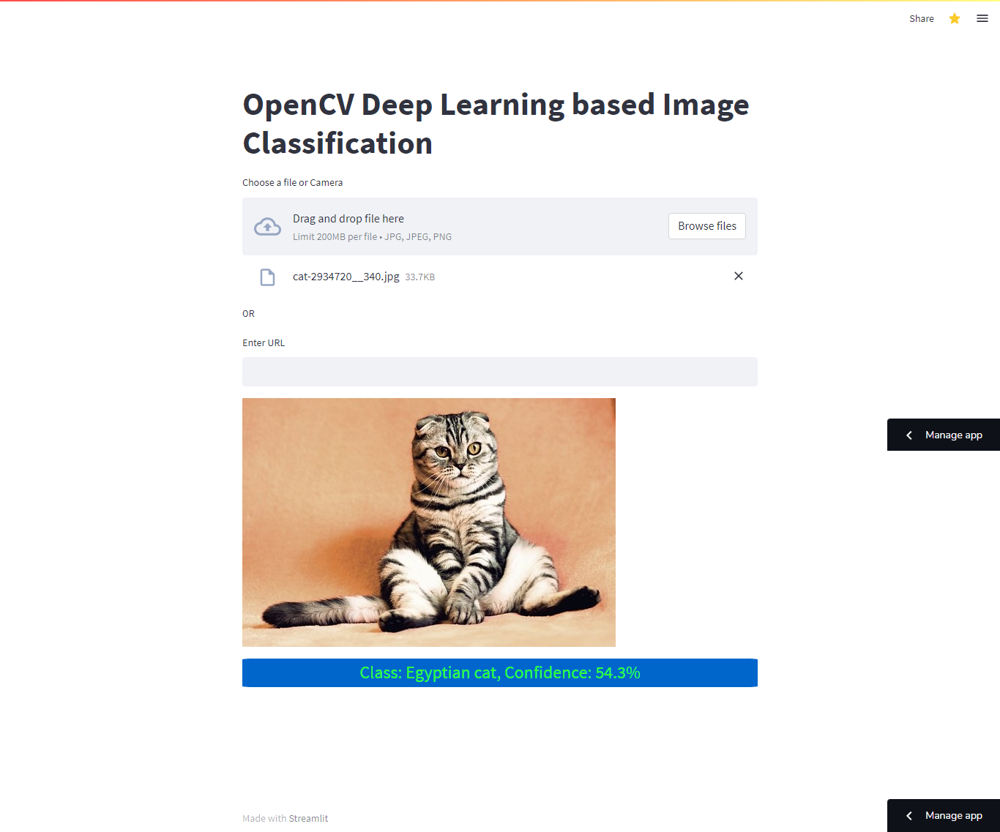

In [1]:
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
import os
from pathlib import Path
import random
from IPython.display import Image, display
from PIL import Image

%matplotlib inline
plt.rcParams["figure.figsize"] = [7.00, 3.50]
plt.rcParams["figure.autolayout"] = True

Image.open('/kaggle/input/watermark-fotos/screencapture-ahed-jneed-opencv-dnn-image-classification-streamlit-app-ukc9n1-streamlit-app-2023-01-04-10_12_44.png')

### What is OpenCV DNN Module?

OpenCV has functionalities for running deep learning models as inference. This module lets you use **pre-trained** neural networks from popular frameworks like TensorFlow, PyTorch, Caffe, etc,and use those models directly in OpenCV, which we can carry out several deep learning functionalities. The feature of supporting models from different frameworks has been a part of OpenCV since version 3.3. Still, many newcomers into the field are not aware of this great feature of OpenCV.

### Why Choose the OpenCV DNN Module?

* The OpenCV DNN module only supports deep learning inference on images and videos.
* It does **not** support fine-tuning and training.
* There are cases where using OpenCV’s DNN module will give you faster inference results for the CPU.
* By using OpenCV’s DNN module for inference the final code is a lot compact and simpler.

Still, the OpenCV DNN module can act as a perfect starting point for any beginner to get into the field of deep-learning based computer vision and play around. Since you don’t have to build your final application with a heavy framework like TensorFlow.


One of the OpenCV DNN module’s best things is that it is highly optimized for Intel processors. We can get good FPS when running inference on real-time videos for object detection and image segmentation applications. We often get higher FPS with the DNN module when using a model pre-trained using a specific framework. For example, let us take a look at image classification inference speed for different frameworks.

![Image source](https://learnopencv.com/wp-content/uploads/2021/04/bar-graph-image-classification-speed-comparison-on-cpu-using-different-frameworks.png)
![Image source](https://learnopencv.com/wp-content/uploads/2021/04/bar-graph-comparing-speed-of-object-detection-using-different-frameworks.png)
![Image source](https://learnopencv.com/wp-content/uploads/2021/04/bar-graph-comparing-fps-for-different-frameworks-and-for-different-neural-network-models-on-raspberry-pi-3b.png)

Image Classification inference speed comparison on CPU for different frameworks.

**The above few graphs show optimized OpenCV, and how fast it is for neural network inference. The data serves as a perfect reason to choose to learn about the OpenCV DNN module in detail.**

# 1. Different Models that OpenCV DNN Module Supports

The OpenCV supports many state-of-the-art models. [**You can check out this wiki**](https://github.com/opencv/opencv/wiki/Deep-Learning-in-OpenCV) for the latest models supported by OpenCV DNN module, noting a small sample of the many models below:

| Image Classification | Object Detection | Image Segmentation | Text detection and recognition | Human Pose estimation | Person and face detection |
|:--------------------:|:----------------:|:------------------:|:------------------------------:|:---------------------:|:-------------------------:|
|        Alexnet       |   MobileNet SSD  |       DeepLab      |            Easy OCR            |       Open Pose       |         Open Face         |
|       GoogLeNet      |      VGG SSD     |        UNet        |              CRNN              |       Alpha Pose      |         Torchreid         |
|          VGG         |   Faster R-CNN   |         FCN        |                                |                       |       Mobile FaceNet      |
|          DenseNet    |   EfficientDet   | OpenCV FaceDetector|                                |                       |                           |                         |

[**Check out the github repo**](https://github.com/opencv/opencv/tree/master/samples/dnn) that contains sample code for all of the above models.

# Frameworks Supported by OpenCV DNN Module 

`OpenCV DNN module` supports a plethora of popular deep learning frameworks:

<br>
<center>
<img src="https://opencv.org/wp-content/uploads/2021/09/c0-m13-dnn-logo.png" alt="OpenCV Dnn modules">
</center>
<br>

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`cv2.dnn.readNetFromCaffe()`**](https://docs.opencv.org/4.5.2/d6/d0f/group__dnn.html#ga29d0ea5e52b1d1a6c2681e3f7d68473a)
<br>


<hr style="border:none; height: 4px; background-color:#D3D3D3" />

# 3. Image Classification using OpenCV DNN 

Let us now see one of the most common computer vision problems using the dnn module of OpenCV. We will use the **DenseNet121** deep neural network model for classifying images into 1000 classes of the famous [*ImageNet*](https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&cad=rja&uact=8&ved=2ahUKEwjasLG-yKbyAhW3IbcAHRW1BZkQFnoECAwQAw&url=https%3A%2F%2Fwww.image-net.org%2F&usg=AOvVaw07SoUbpxRQk8ZNEiJoLqt5) dataset.

We will follow the following steps to classify an image:

1. Load the class names from .txt file and extract the labels. This has a list of all objects that can be identified by the model.
2. Load the pre-trained neural network model from disk using the `readNet` function.
3. Load the image from disk to pass through model
4. Prepare the input image by converting it to a blob using the `blobFromImage` function.
5. Set the blob as an input to the network using `setInput`
6. Use `forward` to pass the blob through the model to get the outputs.

## 3.1 Read Class File 
This will read the class file associated with the Imagenet dataset. It has 1000 objects and their class IDs. We will use this information to decode the predictions obtained from the network.

In [2]:
# Read the ImageNet class names.
with open('/kaggle/input/watermark-fotos/classification_classes_ILSVRC2012.txt', 'r') as f:
    image_net_names = f.read().split('\n')

# Save the names of all possible classifications, removing empty final line.
class_names = image_net_names[:-1]

# Verify the size, and inspect one of the classes by name.
print(len(class_names), class_names[0])

1000 tench, Tinca tinca


<hr style="border:none; height: 4px; background-color:#D3D3D3" />

## Reading any DNN model

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

OpenCV provides **`readNet()`** to read deep learning network represented in any of the supported format and returns `Net` object.

### <font style="color:rgb(8,133,37)">Function Syntax </font>
``` python
cv2.dnn.readNet( model[, config[, framework]] )
```
The function has **2 required arguments** and 1 optional argument:

1. `model` is the binary file containing trained weights.
2. `config`	text file contains network configuration.
3. `framework` explicit framework name tag to determine a format.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`cv2.dnn.readNet()`**](https://docs.opencv.org/4.5.2/d6/d0f/group__dnn.html#ga3b34fe7a29494a6a4295c169a7d32422)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

## Load Model

Loads the model using the readNet function. We will use a caffe model for this example.

* The .prototxt file contains the network architecture information.
* The .caffemodel file contains the weights of the model.

In [3]:
# Loading the Classification model.
config_file = '/kaggle/input/watermark-fotos/DenseNet_121.prototxt'
model_file = '/kaggle/input/watermark-fotos/DenseNet_121.caffemodel'

model = cv2.dnn.readNet(model=config_file, config=model_file, framework='Caffe')

## 3.3 Read Image

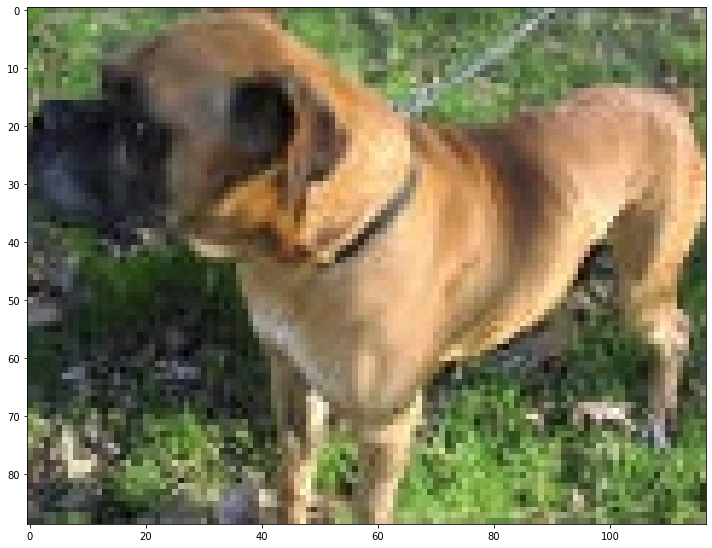

In [4]:
# Load and display the image from disk.
tiger_img = cv2.imread('/kaggle/input/natural-images/natural_images/dog/dog_0000.jpg')
plt.figure(figsize=[10, 10])
plt.imshow(tiger_img[:, :, ::-1]);

## Converting image to blob

Next, we need to convert the image into a format that the model can understand.

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

**`blobFromImage()`** Creates 4-dimensional blob from image. Optionally resizes and crops image from center, subtract mean values, scales values by scalefactor and swap Blue and Red channels.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`cv2.dnn.blobFromImage()`**](https://docs.opencv.org/4.5.2/d6/d0f/group__dnn.html#ga98113a886b1d1fe0b38a8eef39ffaaa0)
<br>
<hr style="border:none; height: 4px; background-color:#D3D3D3" />

In order to construct our blob, we need to read the `DenseNet_121.prototxt` file to find what blob specification it needs. At the top of this file, you would find:

```
name: "DENSENET_121"
input: "data"
input_dim: 1
input_dim: 3
input_dim: 224
input_dim: 224
```
There is one other thing to note here. All the deep learning models expect input in batches. However, we only have one image here. Nevertheless, the blob output that we get here actually has a shape of [1, 3, 224, 224]. Observe that one extra batch dimension has been added by the blobFromImage() function. This would be the final and correct input format for the neural network model.

This gives us the blob size we need to create, with input dimensions for: 

* 1 = Number of images (per blob)
* 3 = Number of channels per image (full color, no alpha)
* (224, 224) = Height and width of the images

The mean and scalefactor to use also come from the model itself ([see here](https://github.com/shicai/DenseNet-Caffe)).

Let's consider the other flags used to create blob. In our example, we know we are reading a caffe model, which always have the BGR color space and thus we do not need to use swapRB. `swapRB=True` is required when the channels of the input image are the reverse of the pre-trained model dataset.

In [5]:
# Create blob from image.
blob = cv2.dnn.blobFromImage(
    image=tiger_img, scalefactor=0.017, size=(224, 224), mean=(104, 117, 123), swapRB=False, crop=False)

**Why is it important that we call `blobFromImage()` prior to performing inference on a test image?**

* It pre-processes our input image in the same way that the images were processed when the deep learning model was trained.
* It reformats the image into a blob representation to prepare it for input into the neural network.

**What is “Mean Subtraction” in the context of deep learning?**

* It is an image pre-processing technique.
* Mean intensity values are subtracted from the image to centre the data around the origin.

**Again. How do we get the Model parameter values, such as mean and scaling factor, for preprocessing the images for a blob?**

These values are established when the model was being trained and we use these same values as these are associated with the model. ([see here](https://github.com/shicai/DenseNet-Caffe)).


## 3.5 Setting input value

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

**`setInput()`** Sets the new input value for the network.

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`cv2.dnn_Net.setInput()`**](https://docs.opencv.org/4.5.2/db/d30/classcv_1_1dnn_1_1Net.html#a5e74adacffd6aa53d56046581de7fcbd)
<br>
<hr style="border:none; height: 4px; background-color:#D3D3D3" />

In [6]:
# Set the input blob for the neural network.
model.setInput(blob)

## 3.6 Detections using the DNN Model

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

**`forward()`** Runs forward pass to compute output of layer with name outputName. Returns blob for first output of specified layer.

**`forward()`** method is used to generate results from a model that already has an input image set

### <font style="color:rgb(8,133,37)">OpenCV Documentation</font>

[**`cv2.dnn_Net.forward()`**](https://docs.opencv.org/4.5.2/db/d30/classcv_1_1dnn_1_1Net.html#a98ed94cb6ef7063d3697259566da310b)

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

In [7]:
# Pass the blob forward through the network.
outputs = model.forward()
final_outputs = outputs[0]

In [8]:
# Make all the outputs 1D, where each represents likihood of matching one of the 1K classification groups.
final_outputs = final_outputs.reshape(1000, 1)

# Get the class label index with the max confidence.
label_id = np.argmax(final_outputs)

# Convert score to probabilities for all matches.
probs = np.exp(final_outputs) / np.sum(np.exp(final_outputs))

print(probs[:10])
print("Max probability:", np.max(probs))

[[4.2228541e-05]
 [1.4185516e-06]
 [6.6188129e-08]
 [1.6550078e-07]
 [3.3126785e-08]
 [3.2931227e-06]
 [2.7467266e-07]
 [4.2421398e-06]
 [8.1463298e-07]
 [8.8141419e-08]]
Max probability: 0.69487375


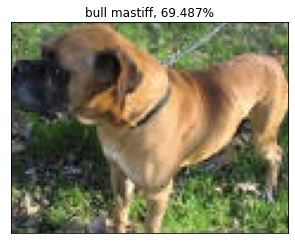

In [9]:
# Get the final highest probability
final_prob = np.max(probs) * 100.0

# Map the max confidence to the class label names.
out_name = class_names[label_id]
out_text = f"{out_name}, {final_prob:.3f}%"

# Display the image, best matched classification, and confidence.
plt.imshow(tiger_img[:, :, ::-1])
plt.title(out_text)
plt.xticks([]), plt.yticks([])
plt.show() 

# 4. More examples

We can now give a try at applying the model to more examples. To more neatly use our workflow, we have defined the prios steps into the below reusable function.

In [10]:
def classify(img):
    image = img.copy()
    # Create blob from image.
    blob = cv2.dnn.blobFromImage(image=image, scalefactor=0.01, size=(224, 224), mean=(104, 117, 123))
    # Set the input blob for the neural network.
    model.setInput(blob)
    # Forward pass image blog through the model.
    outputs = model.forward()
    
    final_outputs = outputs[0]
    # Make all the outputs 1D.
    final_outputs = final_outputs.reshape(1000, 1)
    # Get the class label.
    label_id = np.argmax(final_outputs)
    # Convert score to probabilities
    probs = np.exp(final_outputs) / np.sum(np.exp(final_outputs))
    # Get the final highest probability
    final_prob = np.max(probs) * 100
    # Map the max confidence to the class label names.
    out_name = class_names[label_id]
    out_text = f"{out_name}, {final_prob:.3f}%"
    return out_text

Now let us use this function to classify a whole folder of images. Feel free to drop in some of your own jpg images into the `input` folder if you want to see what the model comes up with.

# Display & Classify Images

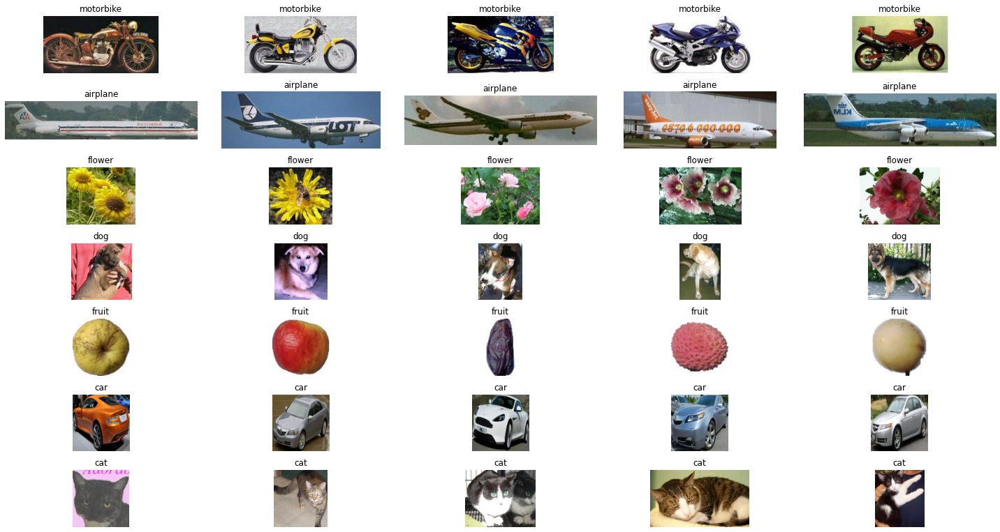

In [11]:
labels = os.listdir('../input/natural-images/data/natural_images/')
path = Path('/kaggle/input/natural-images/natural_images')
rand_img_stor = []
def displayRandomImagesFromEveryFolder(directory=path, samplesPerFolder=5):

    fig = plt.figure(figsize=(20,15))
    
    for rowIndex in range(1, 8):
        path = directory/labels[rowIndex -1]
        images = os.listdir(path)
        for sampleIndex in range(1,samplesPerFolder+1):
            randomNumber = random.randint(0, len(images)-1)
            rand_img_path = path/images[randomNumber]
            image = Image.open(rand_img_path)
            rand_img_stor.append(str(rand_img_path))
            ax = fig.add_subplot(10, 5, samplesPerFolder*rowIndex + sampleIndex)
            ax.axis("off")
            
            plt.title(str(labels[rowIndex -1]))
            plt.imshow(image, cmap='gray')
            
    
    plt.show()

    
displayRandomImagesFromEveryFolder()

Classifying /kaggle/input/natural-images/natural_images/motorbike/motorbike_0084.jpg


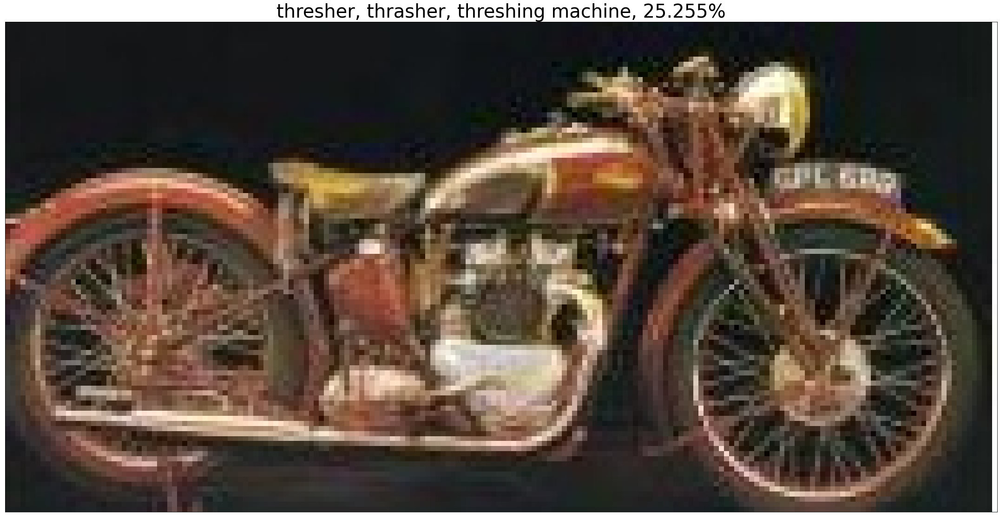

Classifying /kaggle/input/natural-images/natural_images/motorbike/motorbike_0468.jpg


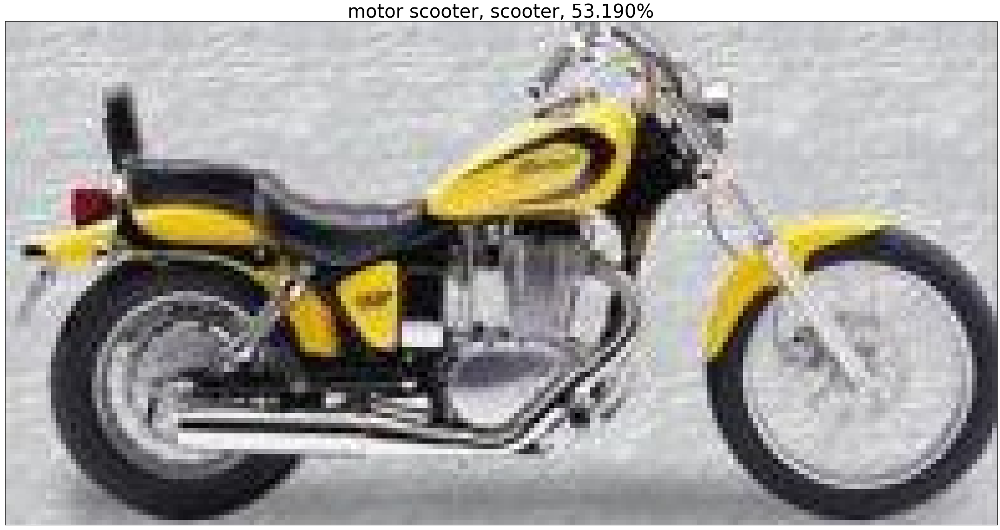

Classifying /kaggle/input/natural-images/natural_images/motorbike/motorbike_0283.jpg


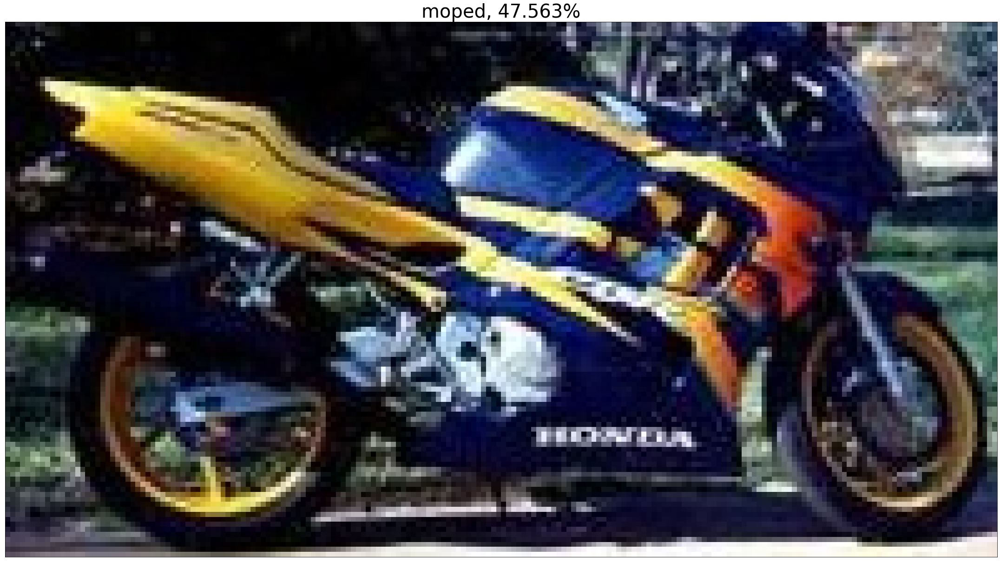

Classifying /kaggle/input/natural-images/natural_images/motorbike/motorbike_0479.jpg


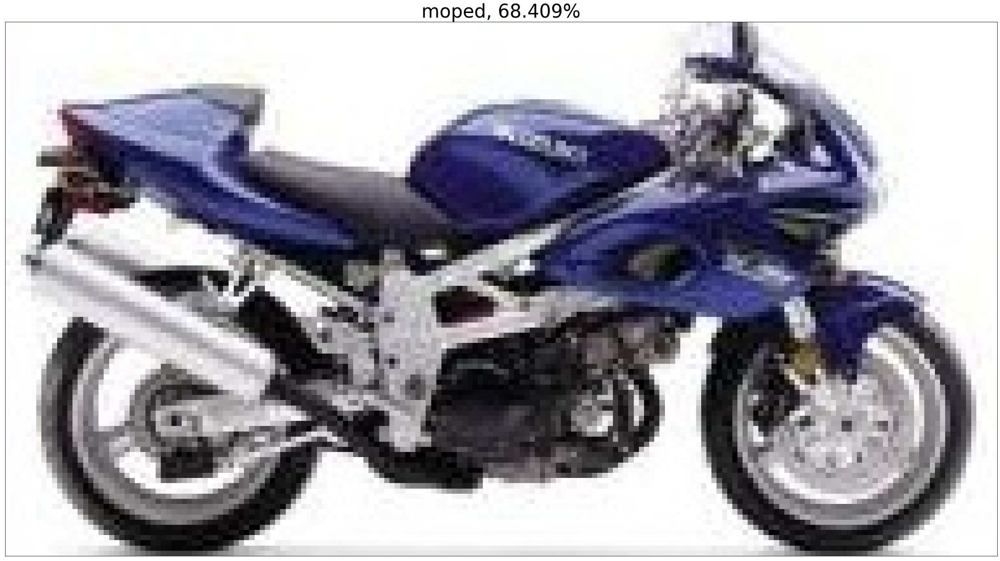

Classifying /kaggle/input/natural-images/natural_images/motorbike/motorbike_0615.jpg


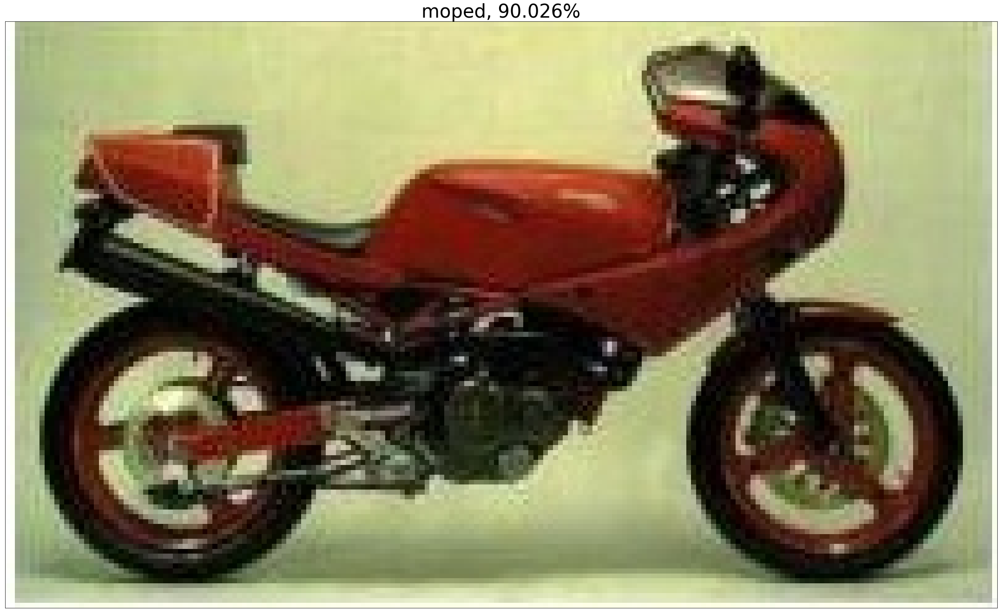

Classifying /kaggle/input/natural-images/natural_images/airplane/airplane_0668.jpg


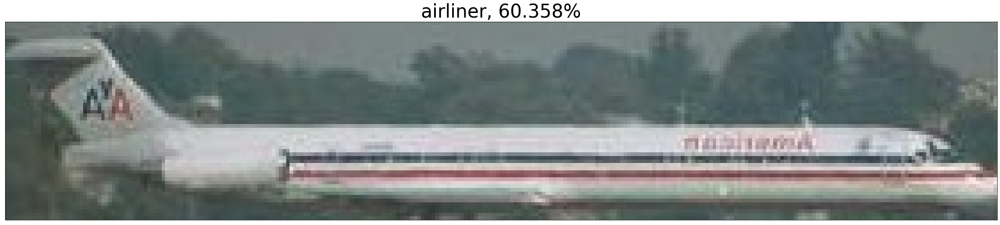

Classifying /kaggle/input/natural-images/natural_images/airplane/airplane_0416.jpg


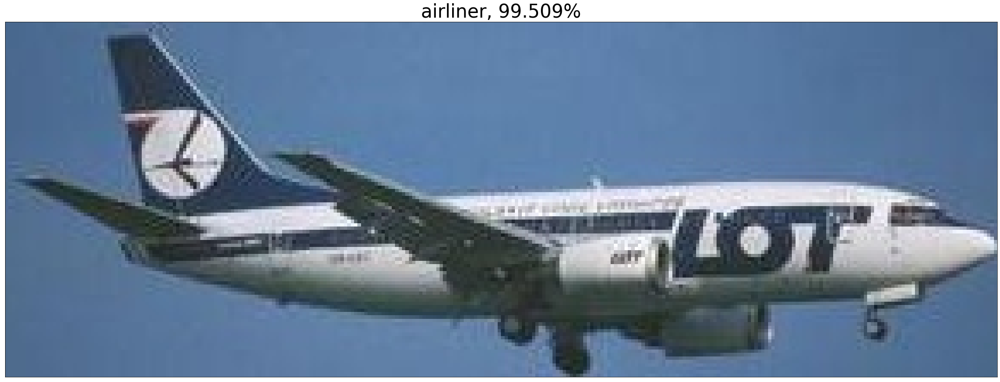

Classifying /kaggle/input/natural-images/natural_images/airplane/airplane_0154.jpg


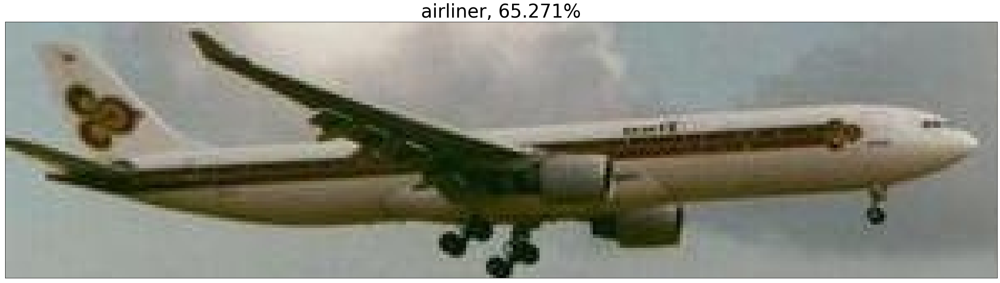

Classifying /kaggle/input/natural-images/natural_images/airplane/airplane_0461.jpg


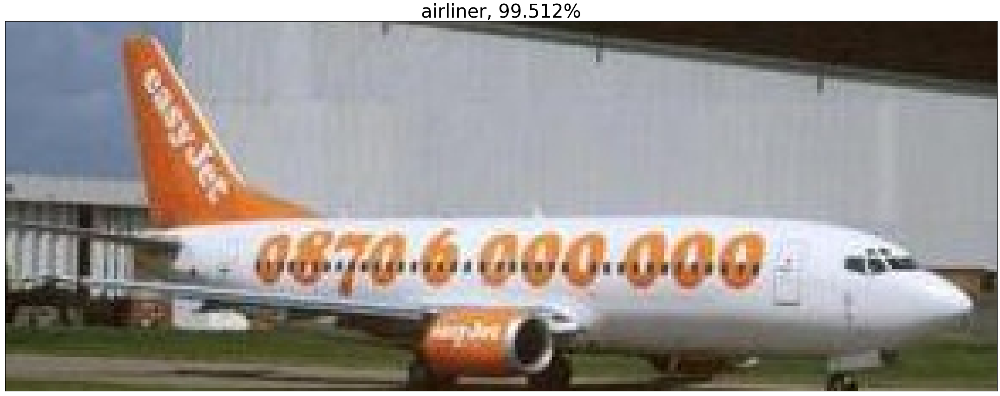

Classifying /kaggle/input/natural-images/natural_images/airplane/airplane_0254.jpg


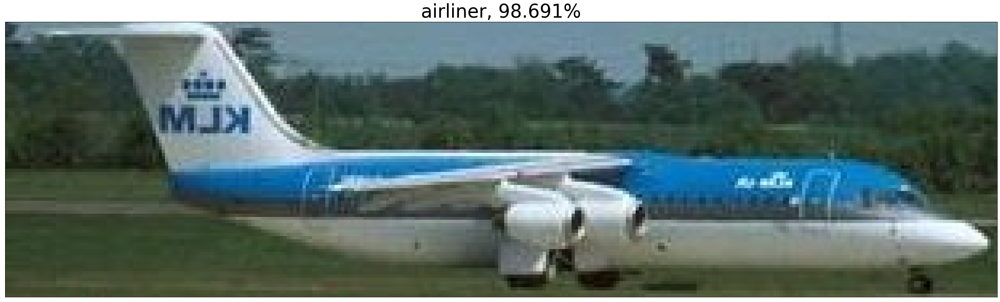

Classifying /kaggle/input/natural-images/natural_images/flower/flower_0518.jpg


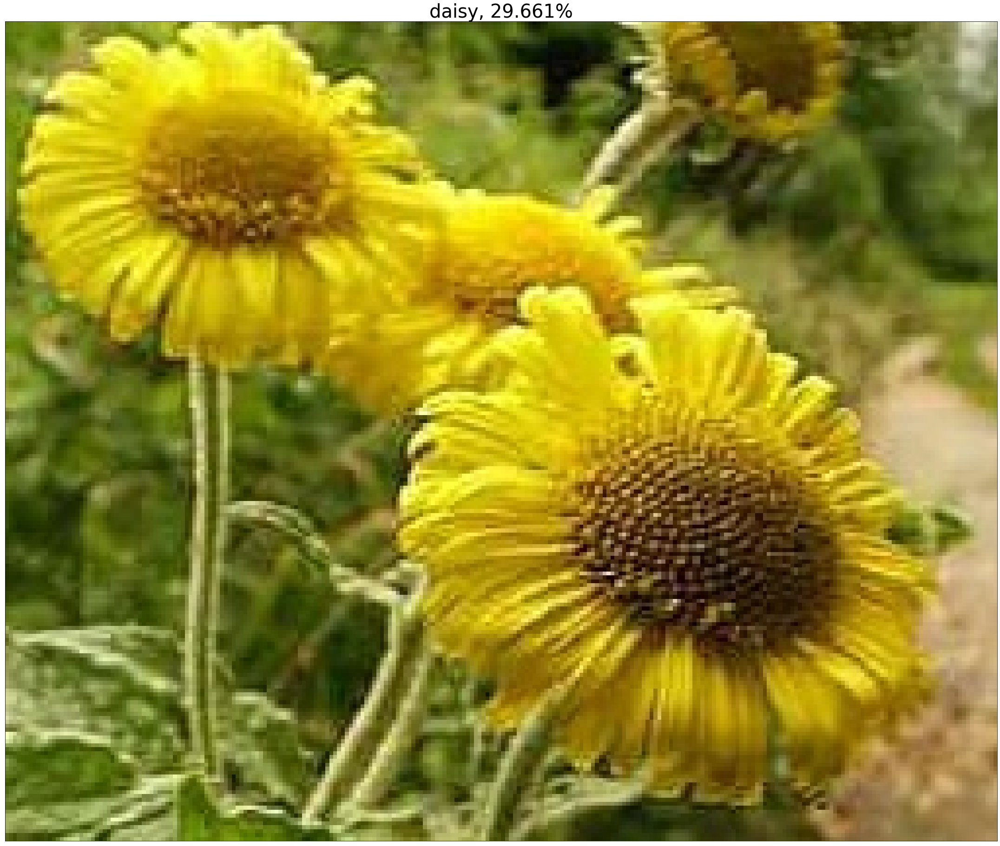

Classifying /kaggle/input/natural-images/natural_images/flower/flower_0107.jpg


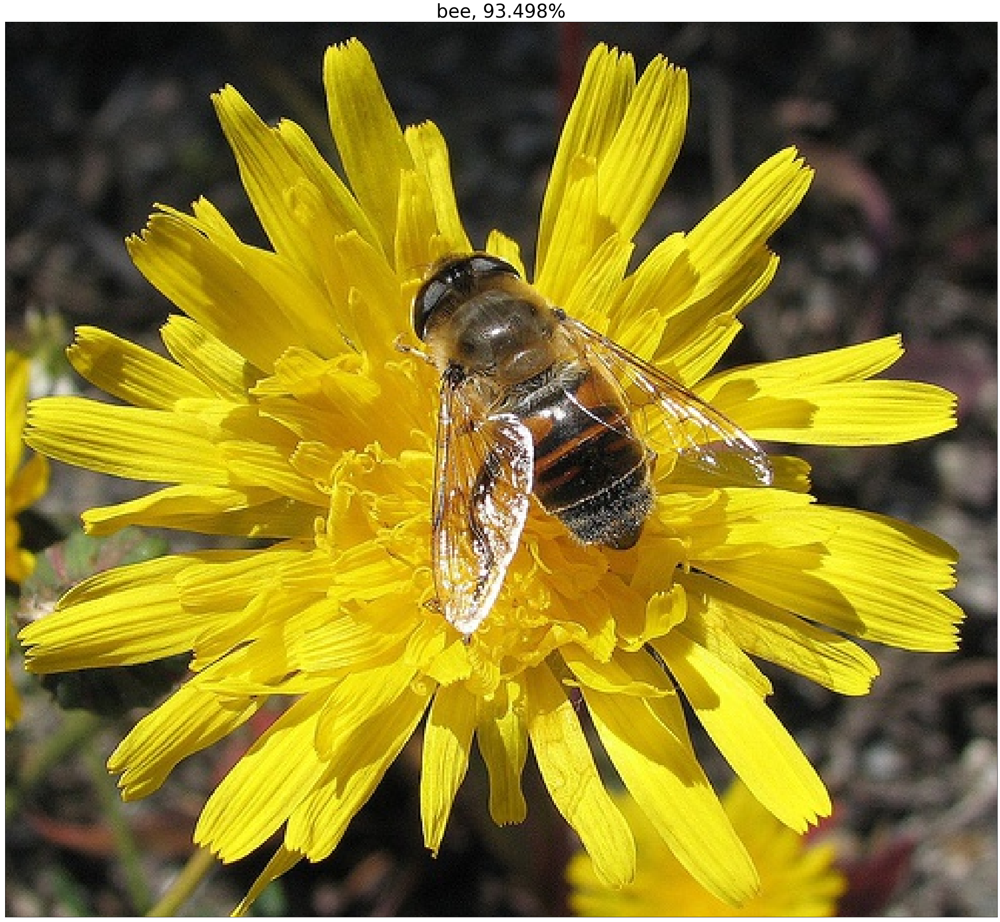

Classifying /kaggle/input/natural-images/natural_images/flower/flower_0750.jpg


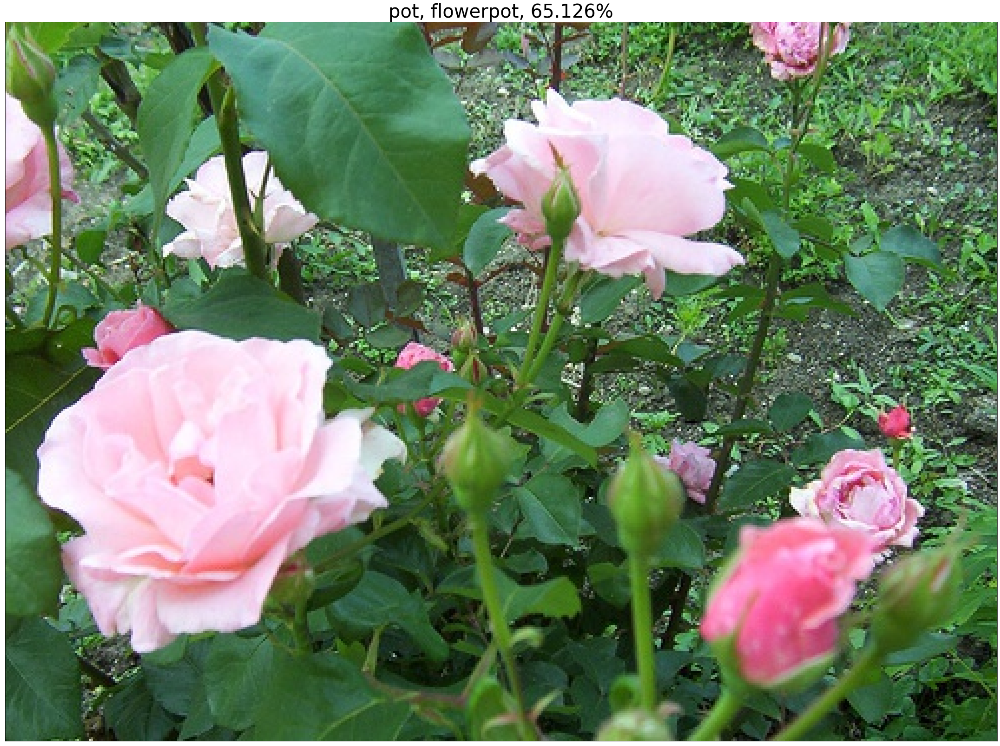

Classifying /kaggle/input/natural-images/natural_images/flower/flower_0454.jpg


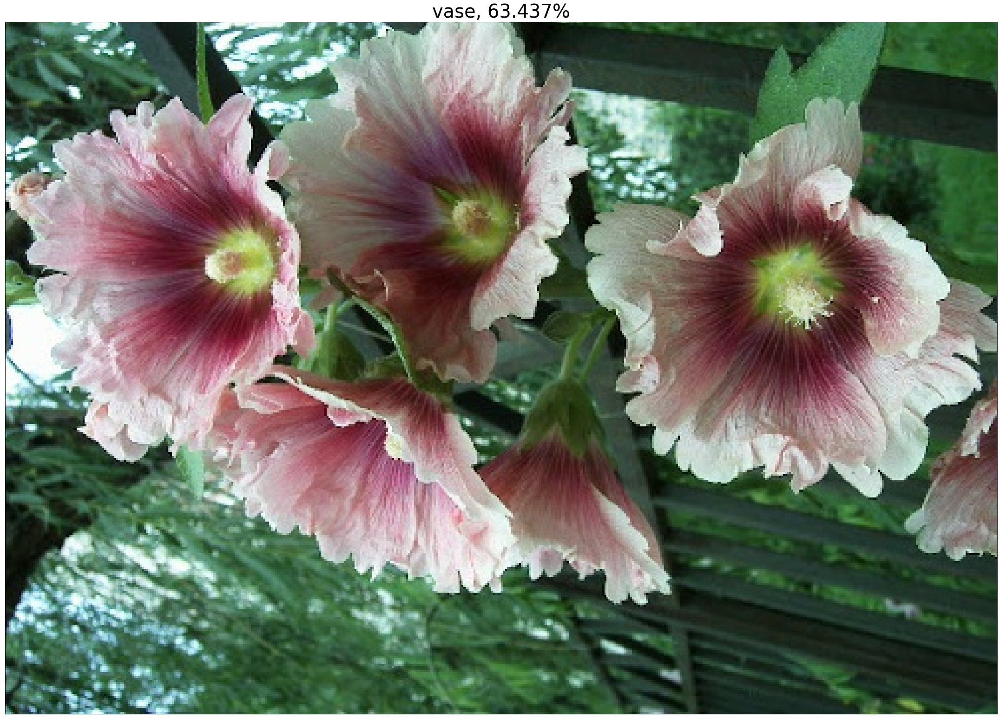

Classifying /kaggle/input/natural-images/natural_images/flower/flower_0368.jpg


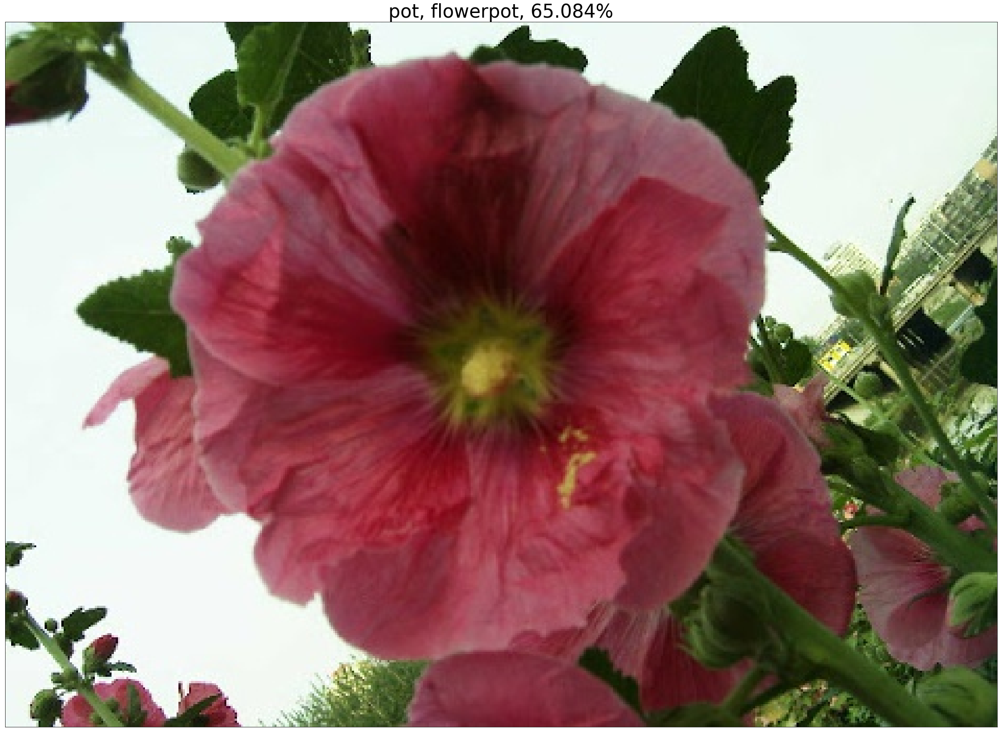

Classifying /kaggle/input/natural-images/natural_images/dog/dog_0537.jpg


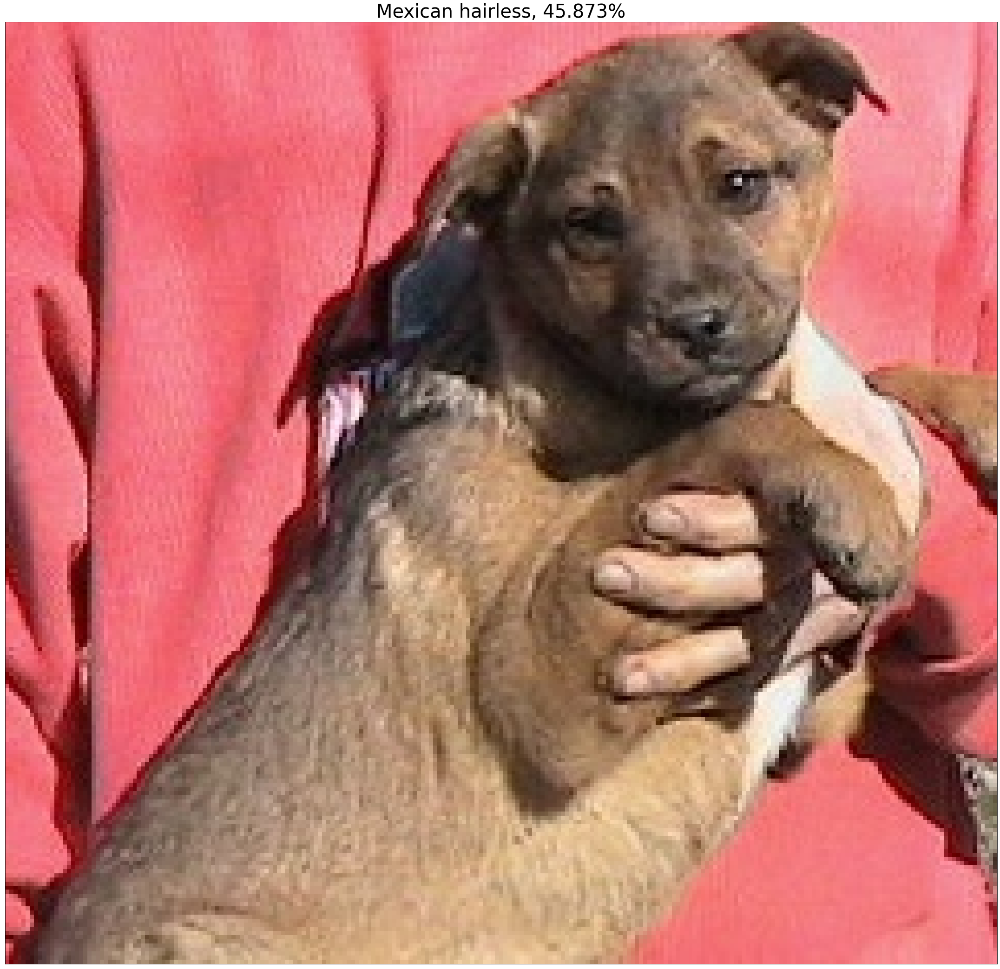

Classifying /kaggle/input/natural-images/natural_images/dog/dog_0505.jpg


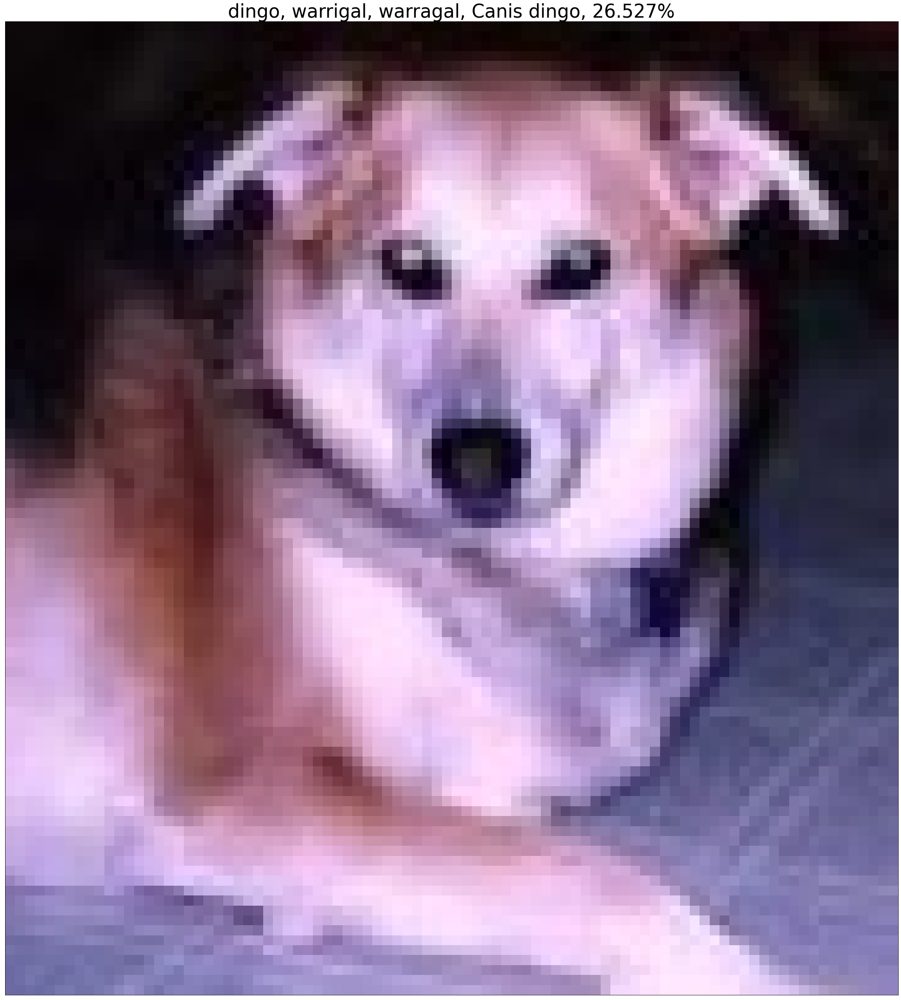

Classifying /kaggle/input/natural-images/natural_images/dog/dog_0312.jpg


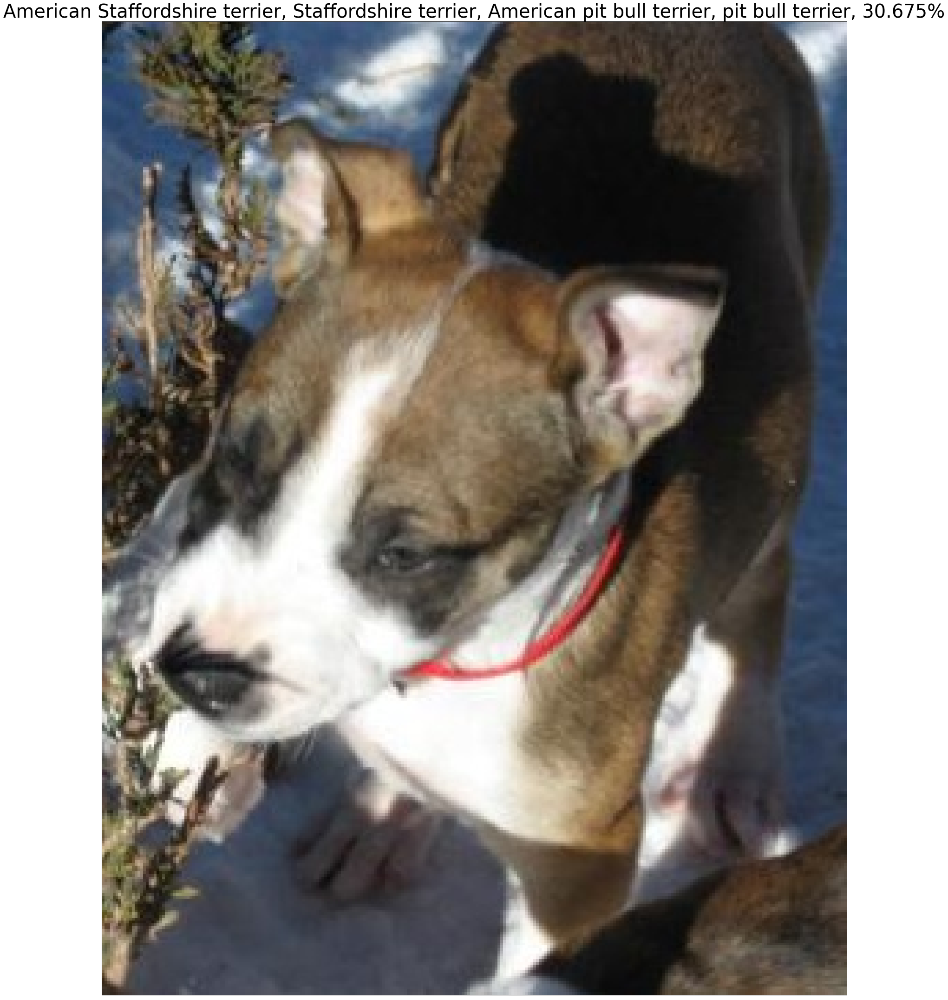

Classifying /kaggle/input/natural-images/natural_images/dog/dog_0092.jpg


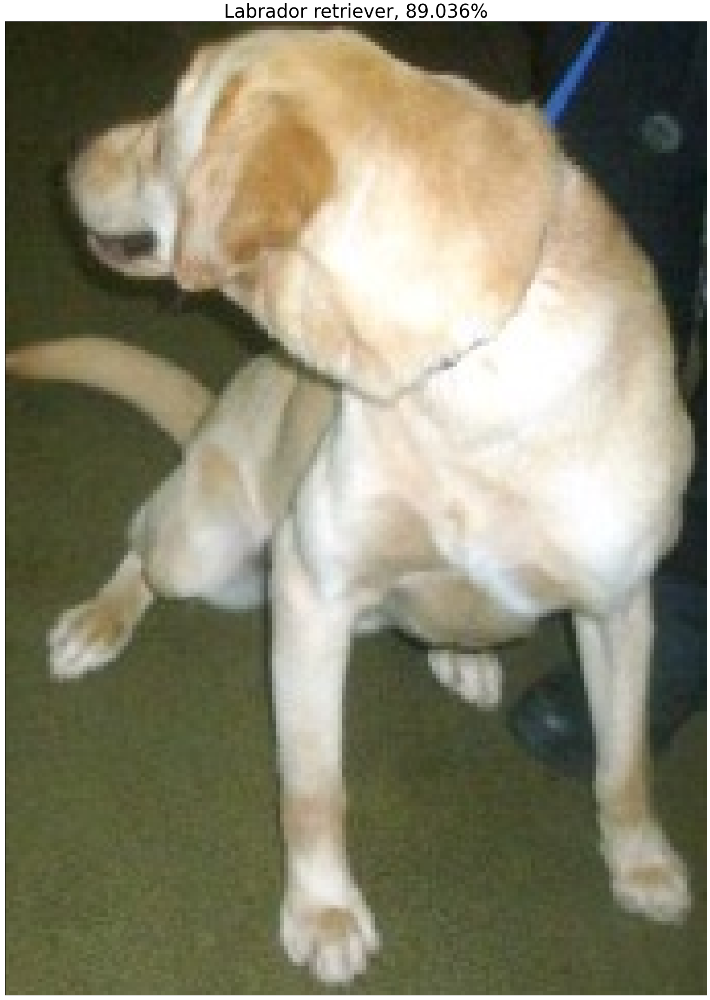

Classifying /kaggle/input/natural-images/natural_images/dog/dog_0602.jpg


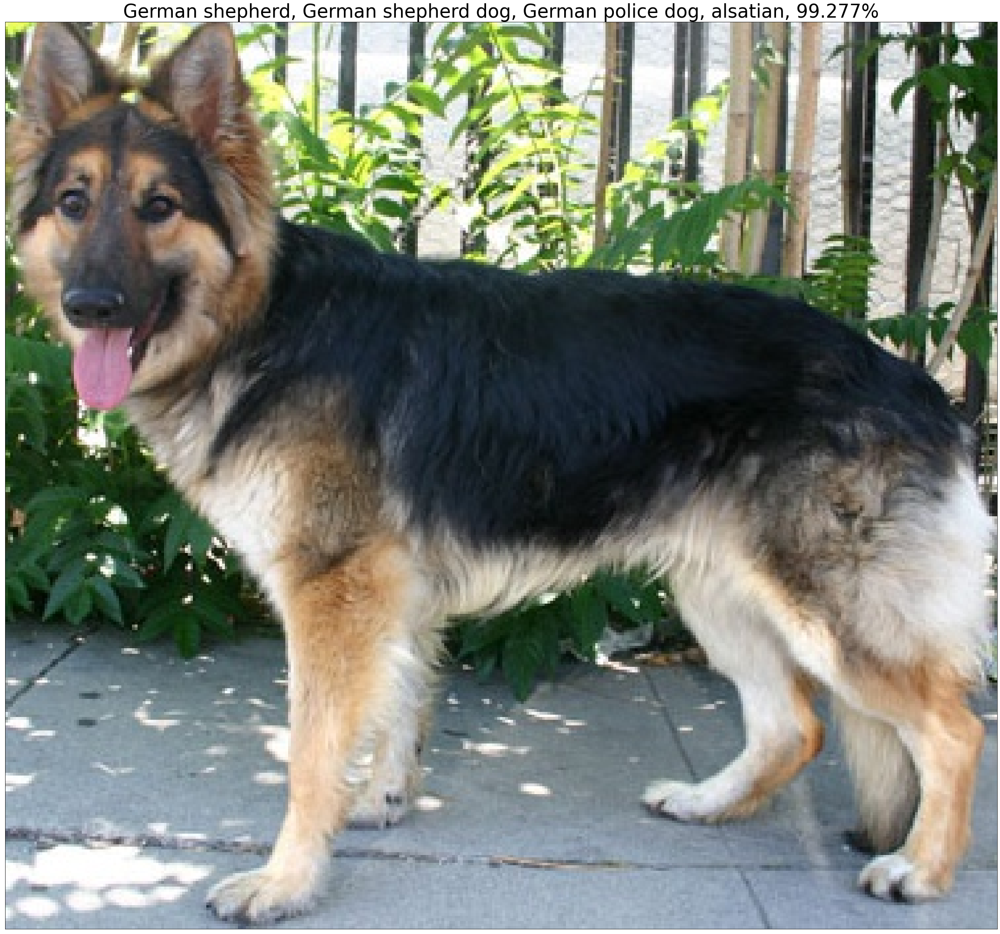

Classifying /kaggle/input/natural-images/natural_images/fruit/fruit_0871.jpg


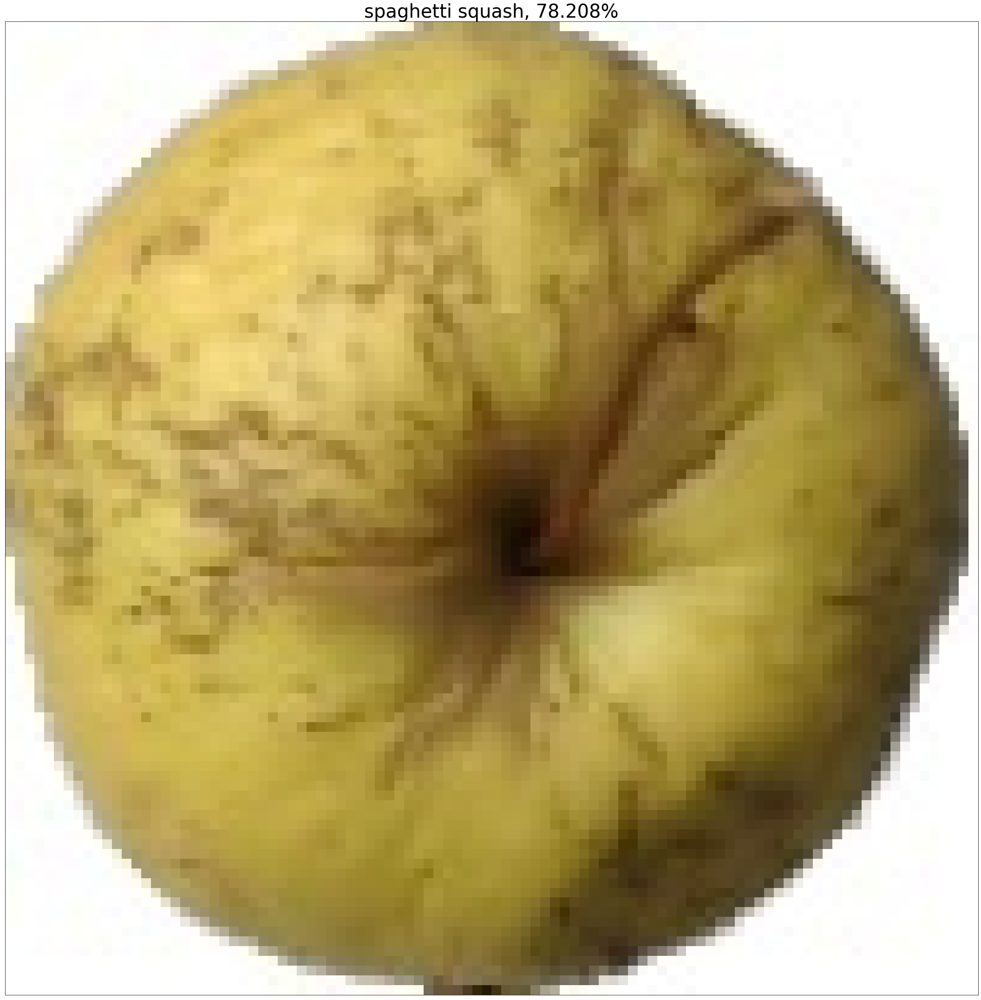

Classifying /kaggle/input/natural-images/natural_images/fruit/fruit_0946.jpg


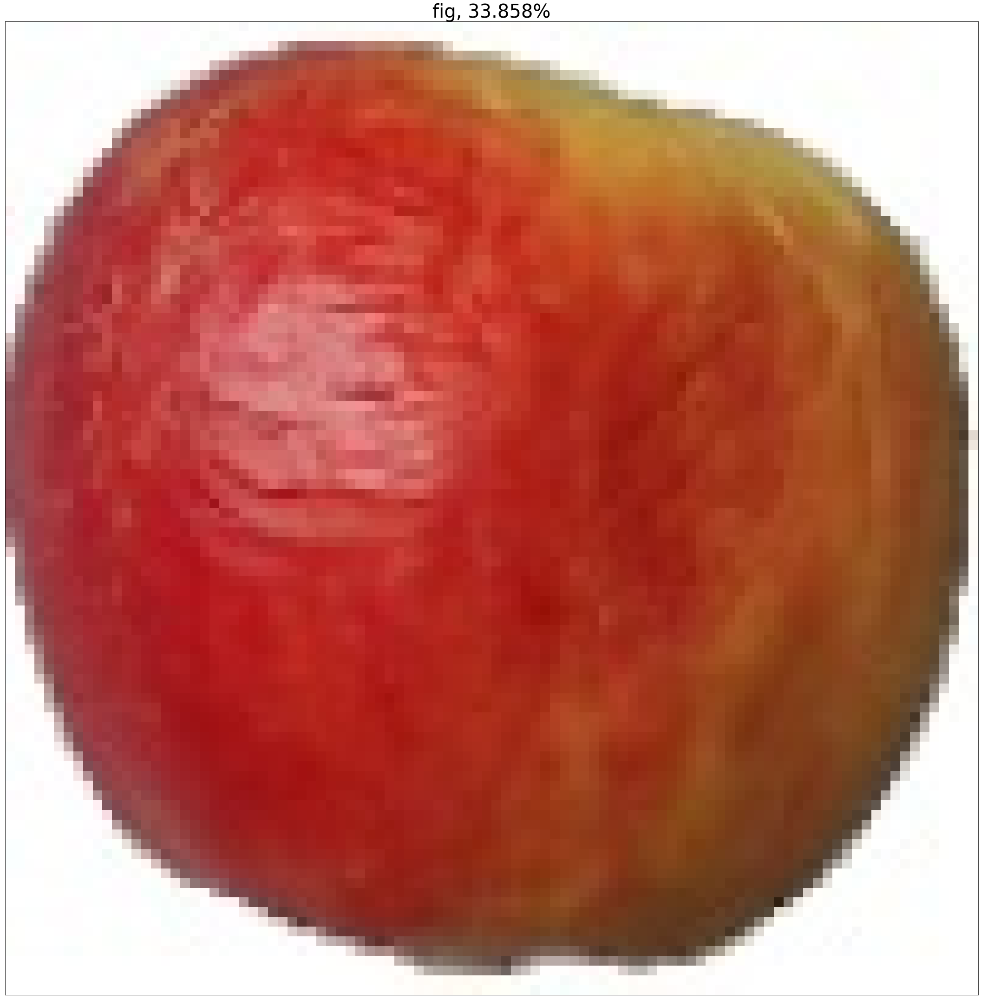

Classifying /kaggle/input/natural-images/natural_images/fruit/fruit_0175.jpg


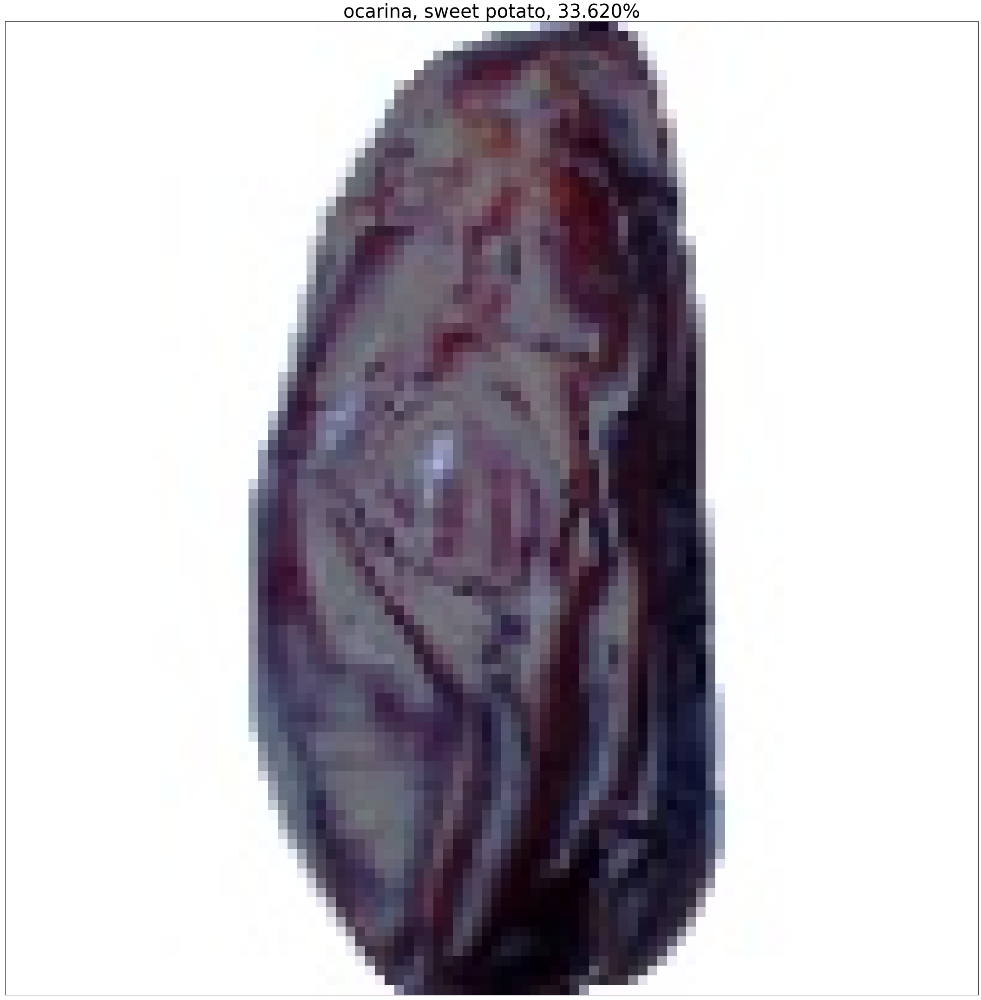

Classifying /kaggle/input/natural-images/natural_images/fruit/fruit_0541.jpg


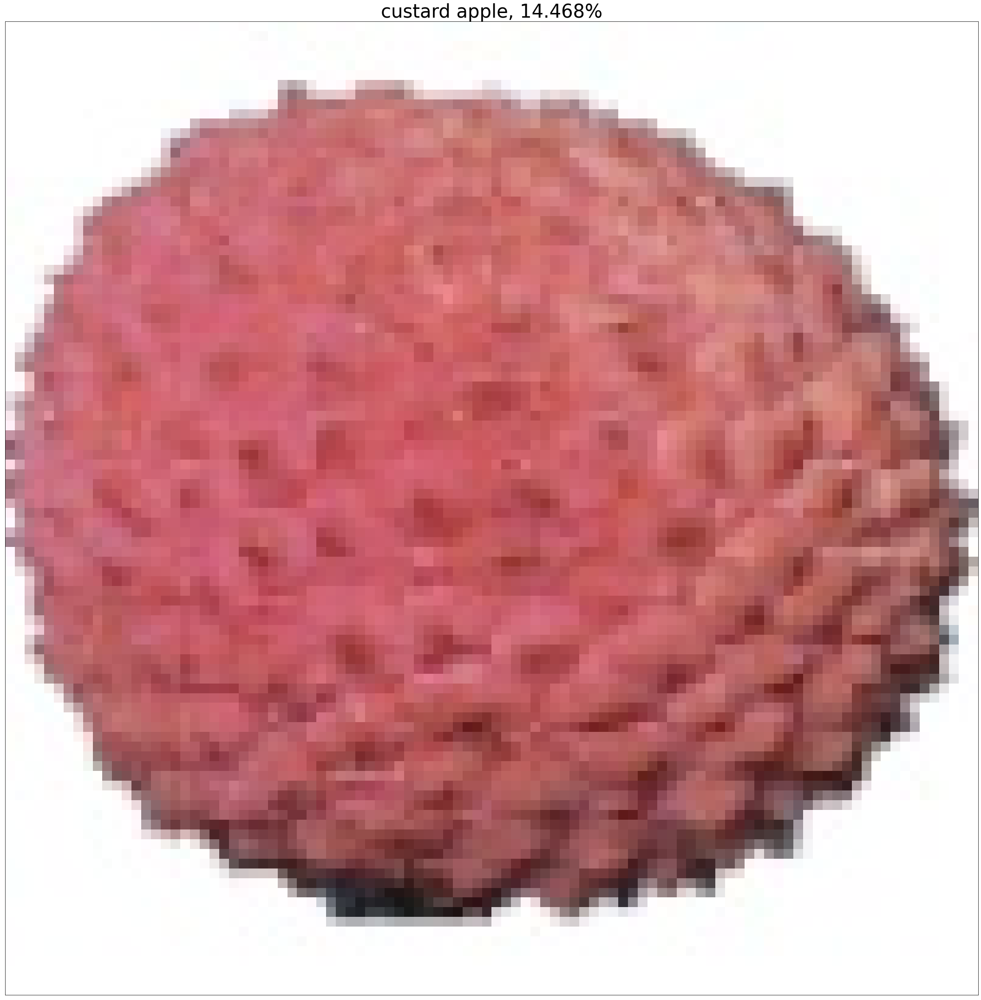

Classifying /kaggle/input/natural-images/natural_images/fruit/fruit_0347.jpg


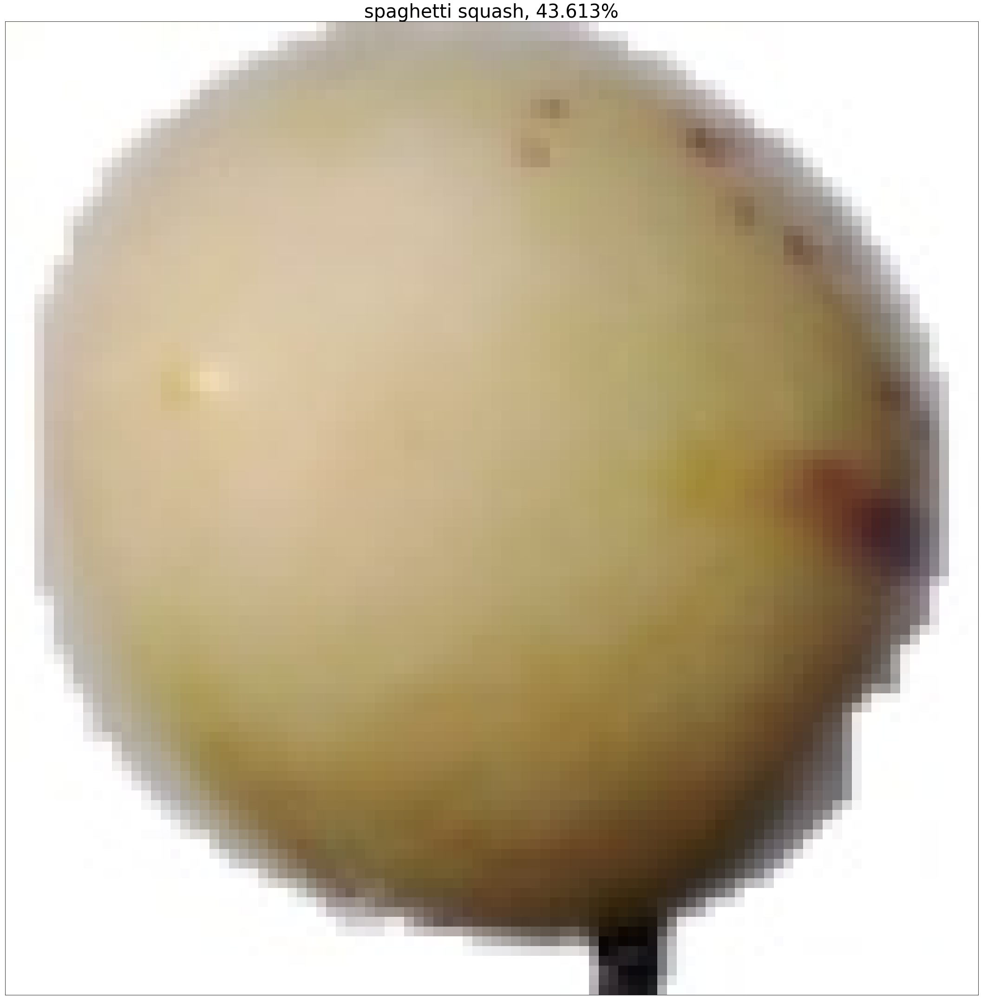

Classifying /kaggle/input/natural-images/natural_images/car/car_0754.jpg


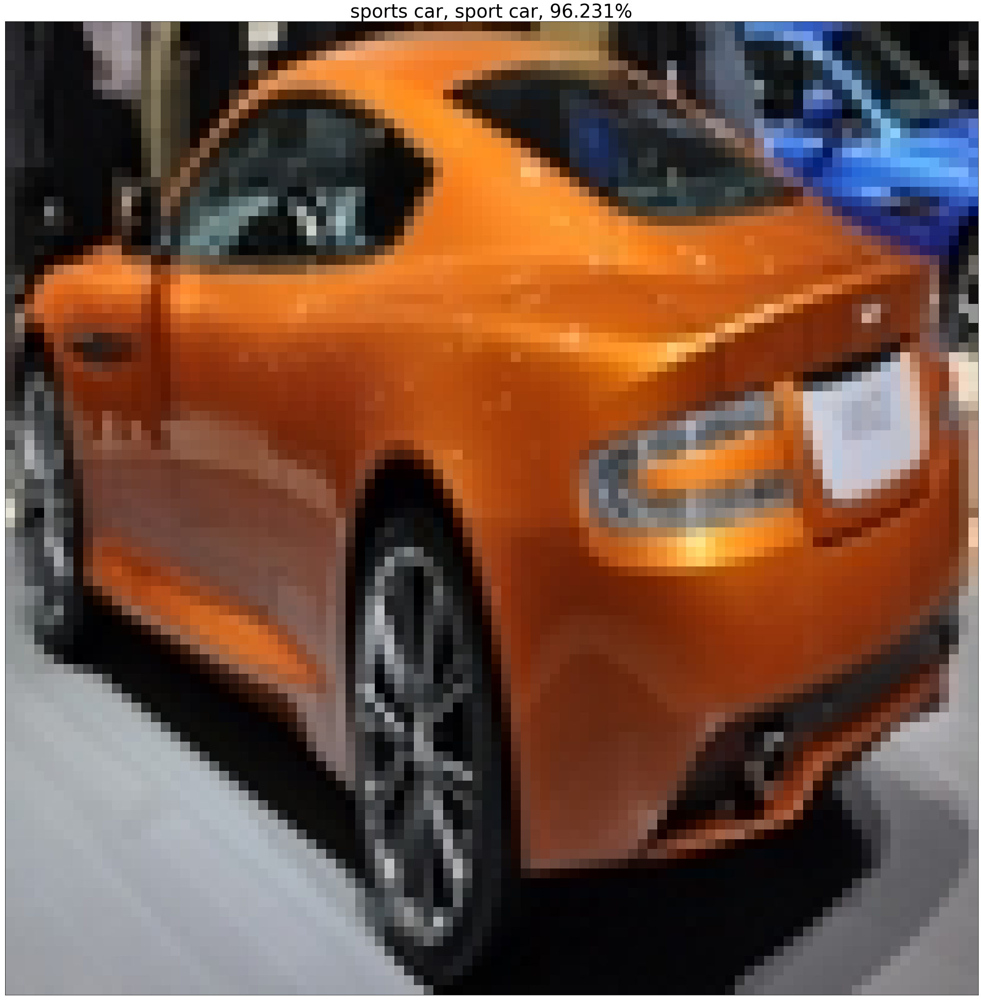

Classifying /kaggle/input/natural-images/natural_images/car/car_0017.jpg


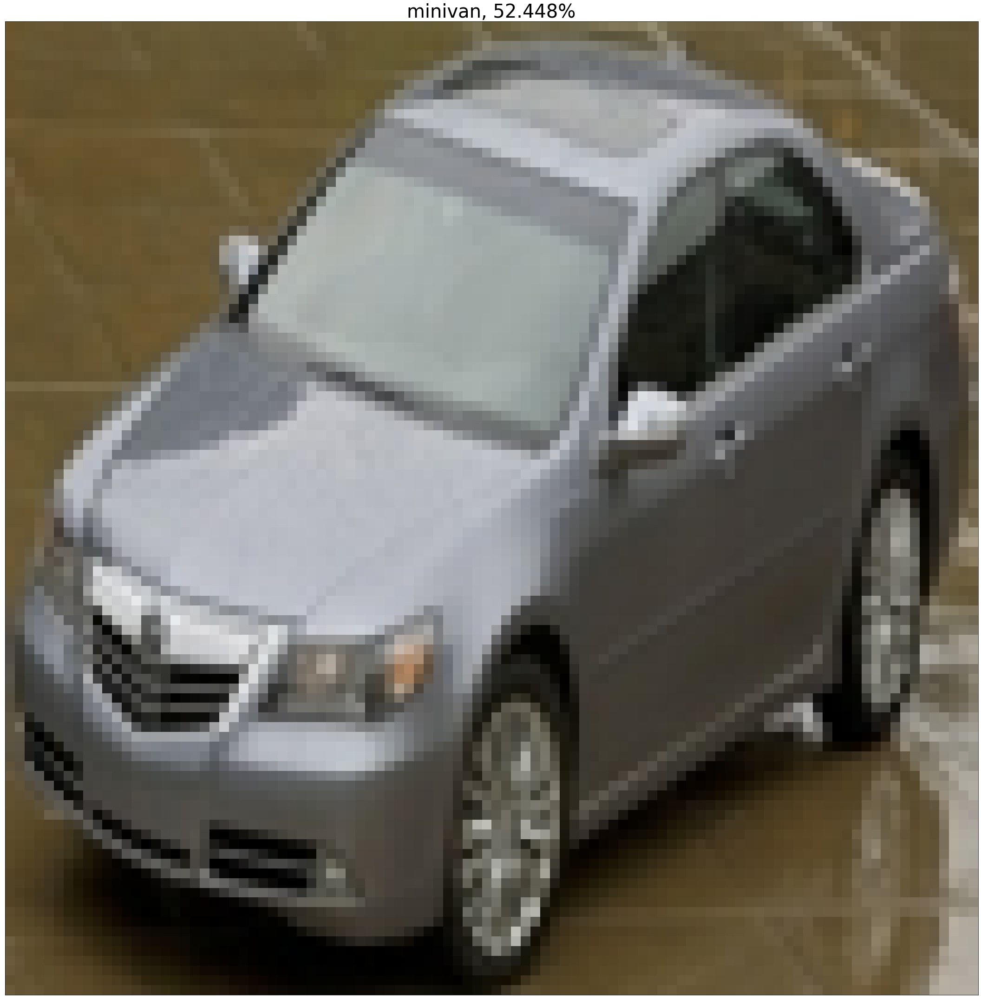

Classifying /kaggle/input/natural-images/natural_images/car/car_0745.jpg


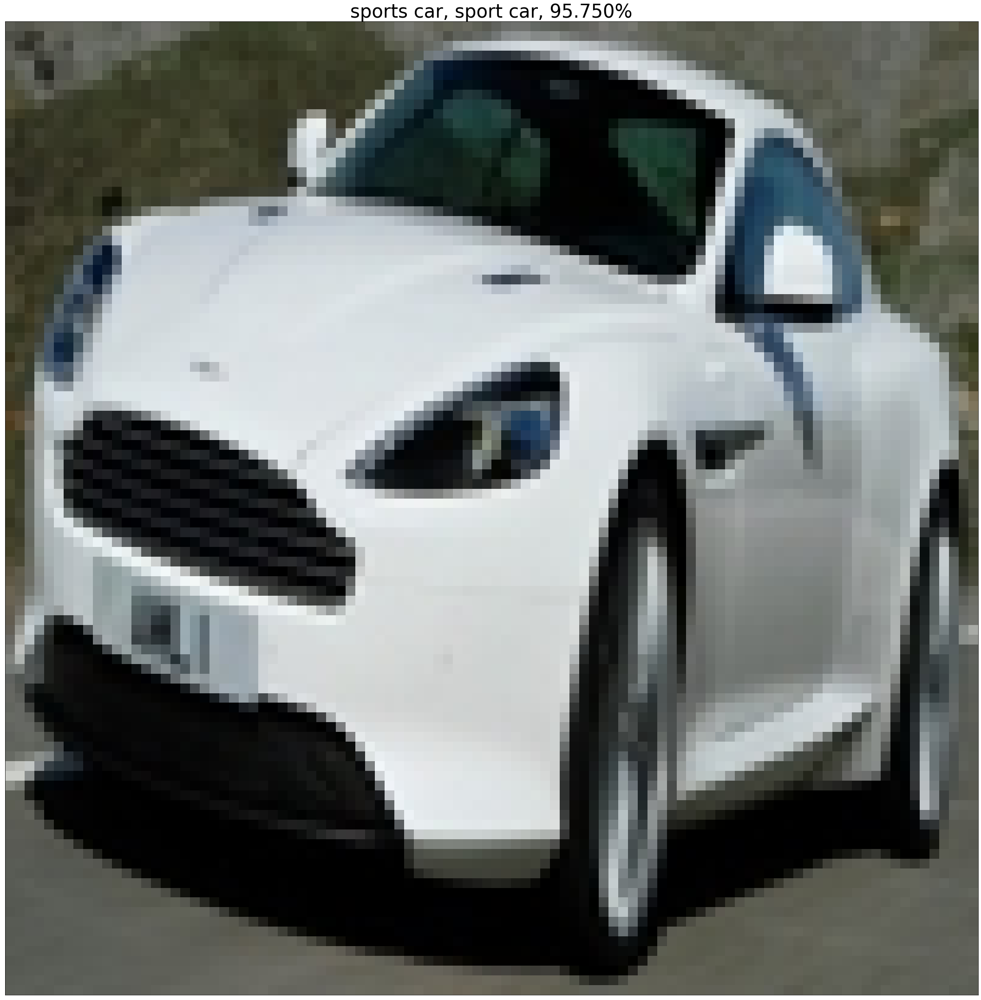

Classifying /kaggle/input/natural-images/natural_images/car/car_0082.jpg


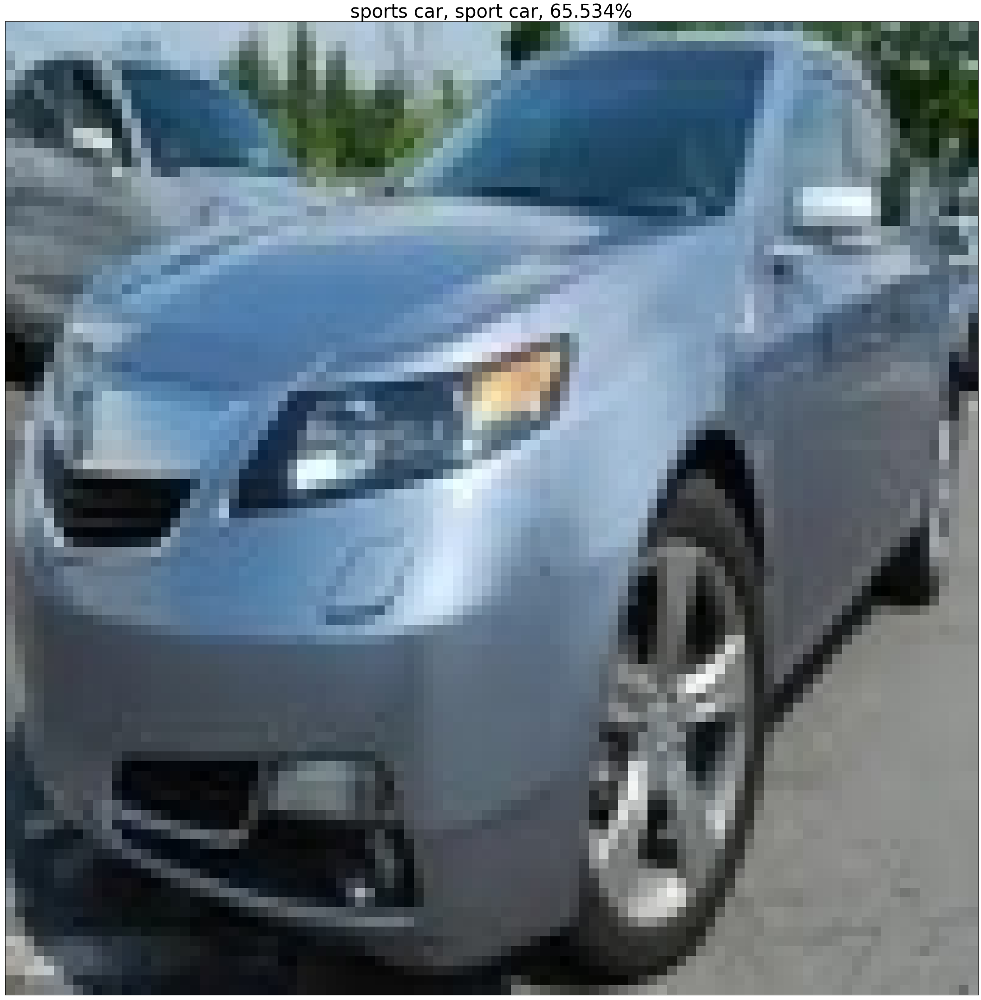

Classifying /kaggle/input/natural-images/natural_images/car/car_0188.jpg


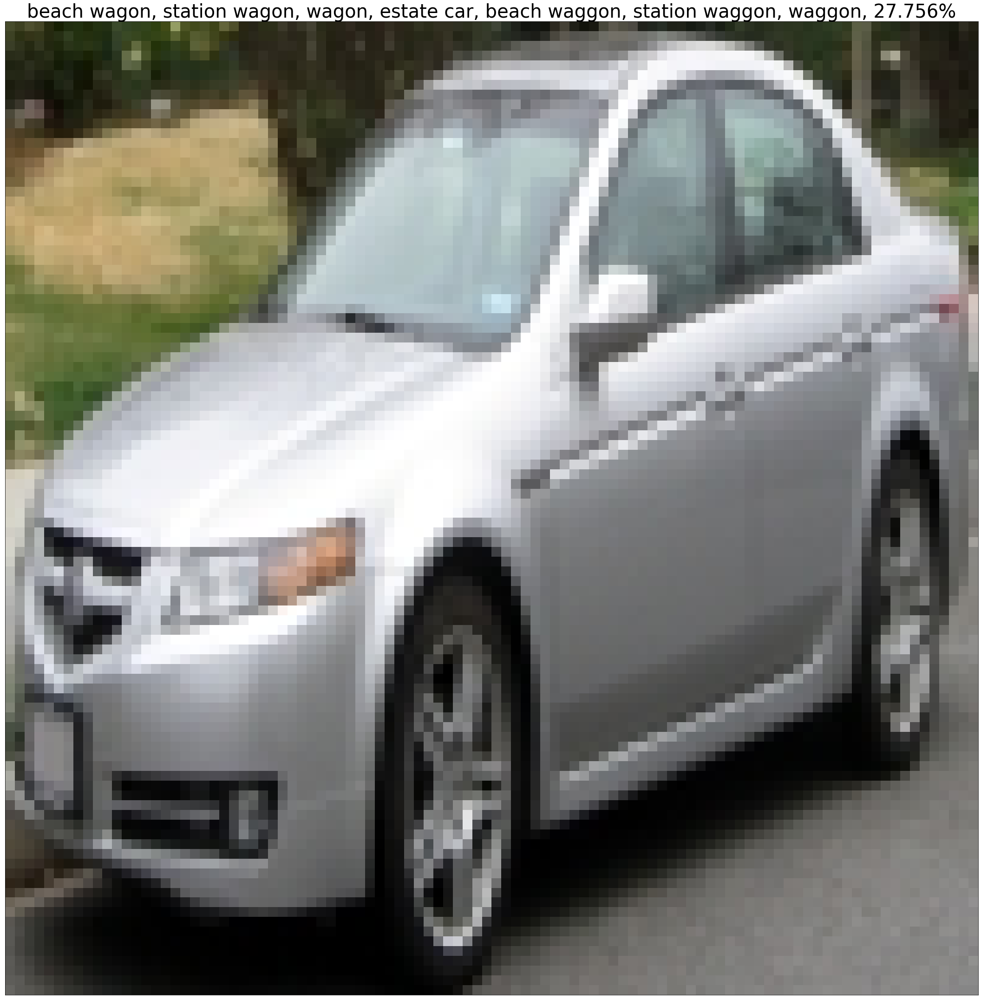

Classifying /kaggle/input/natural-images/natural_images/cat/cat_0385.jpg


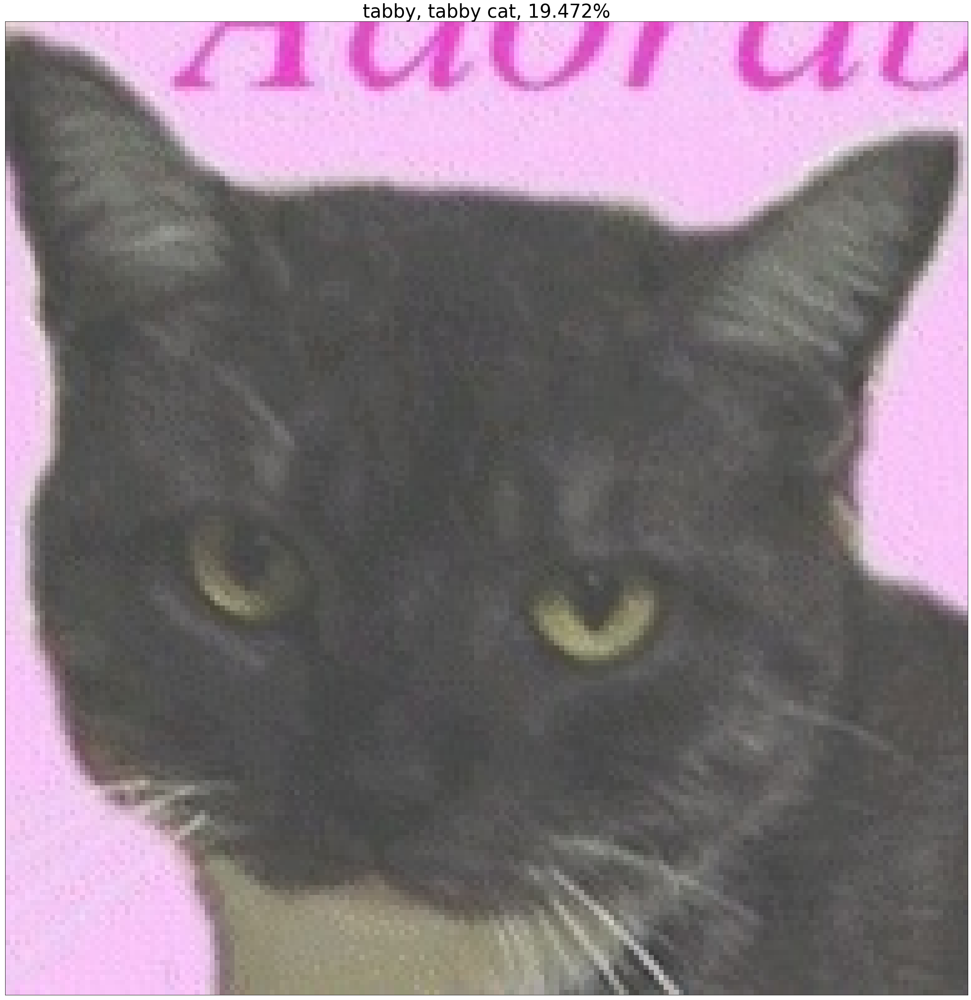

Classifying /kaggle/input/natural-images/natural_images/cat/cat_0491.jpg


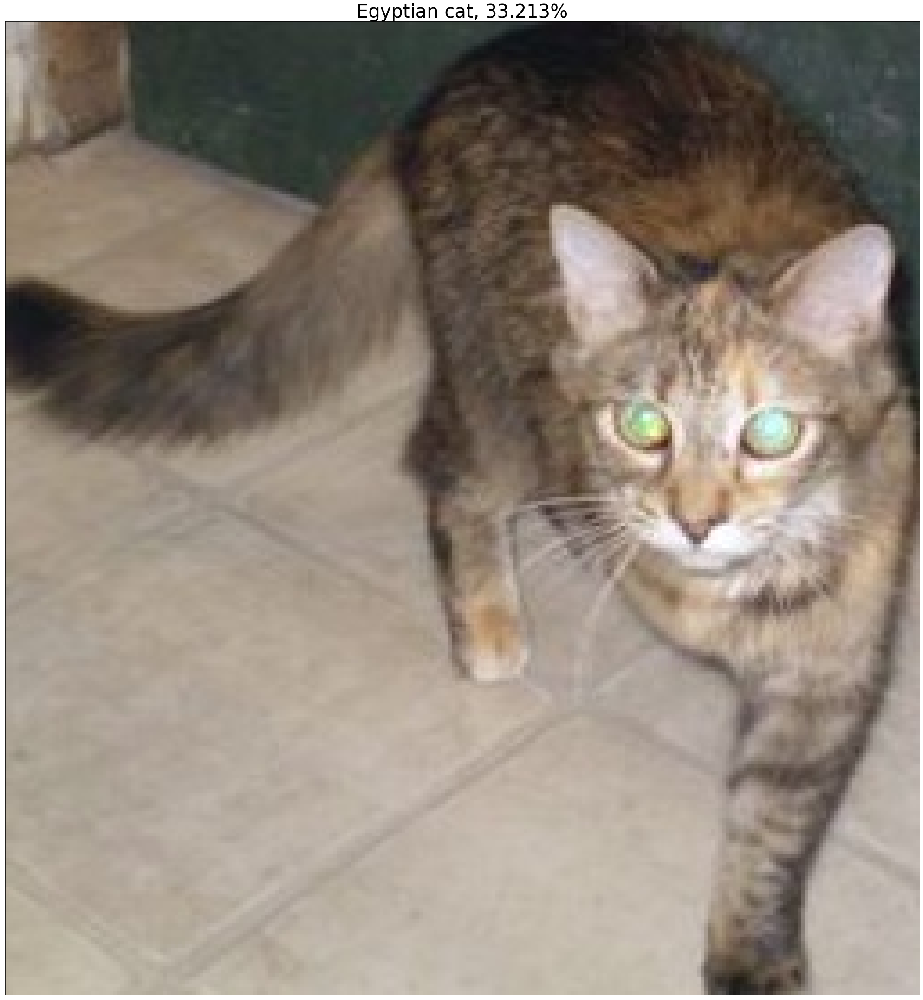

Classifying /kaggle/input/natural-images/natural_images/cat/cat_0804.jpg


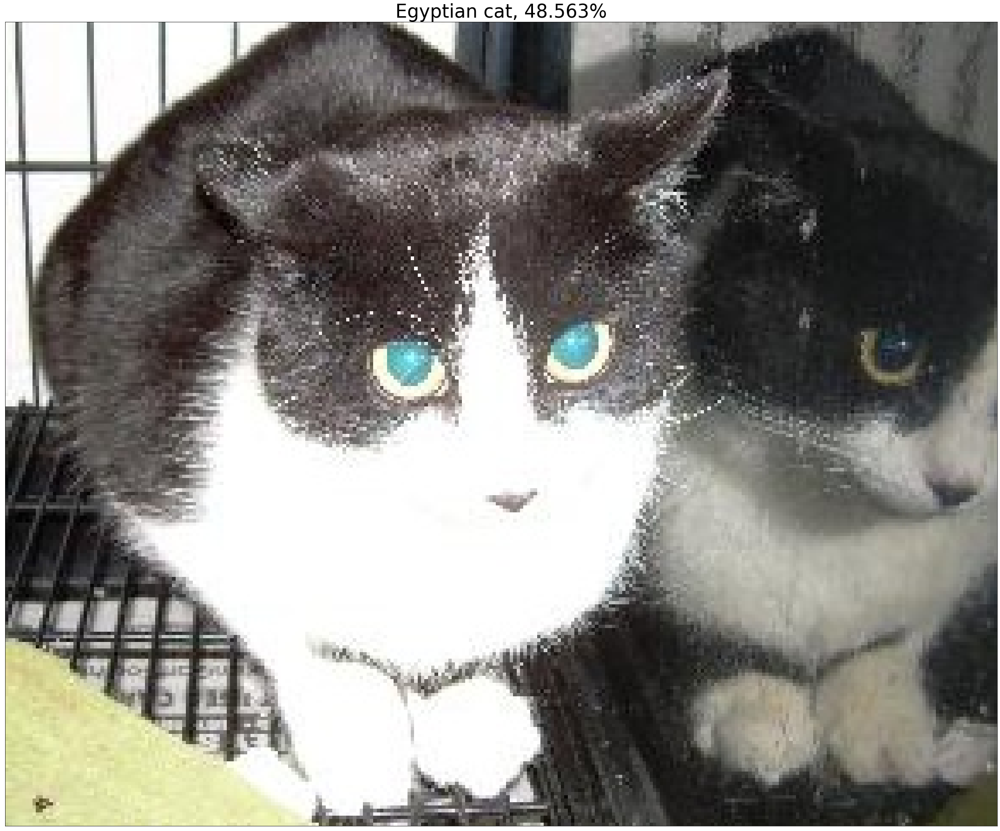

Classifying /kaggle/input/natural-images/natural_images/cat/cat_0118.jpg


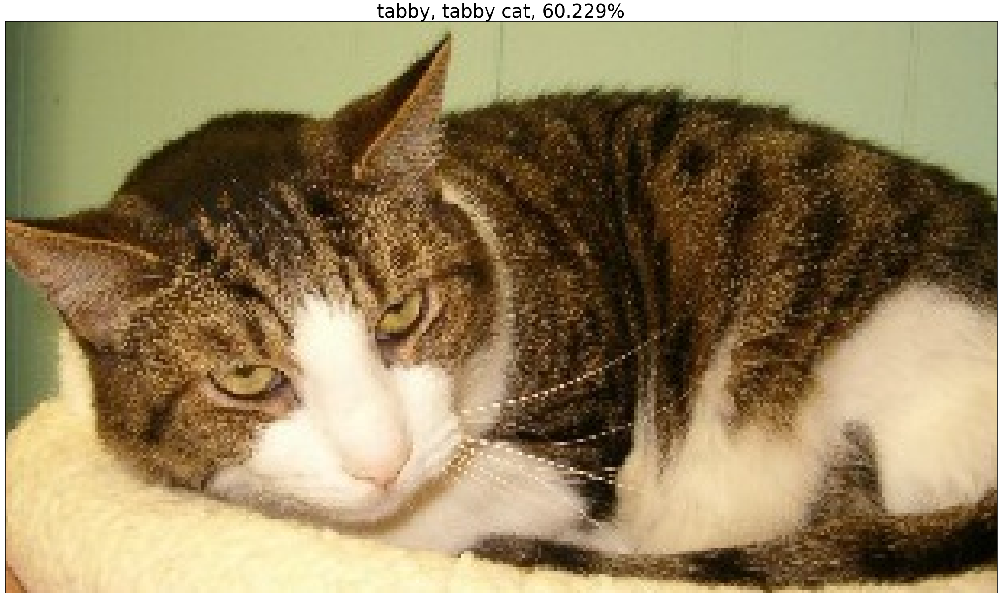

Classifying /kaggle/input/natural-images/natural_images/cat/cat_0052.jpg


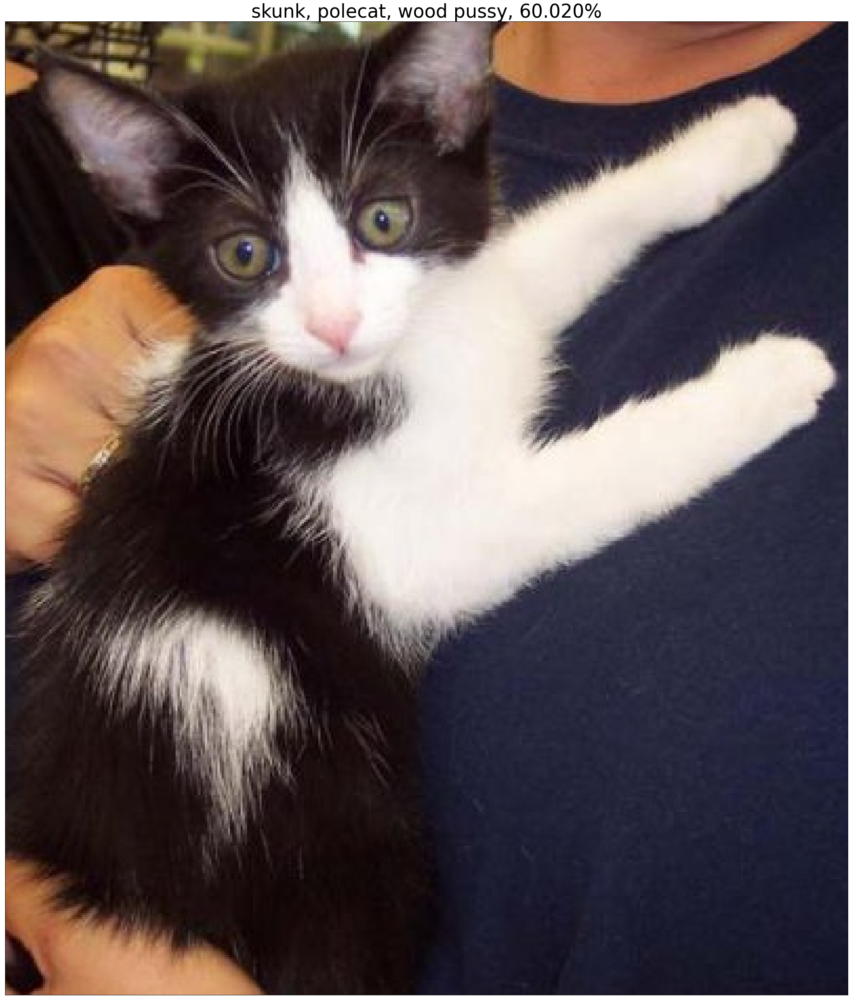

In [12]:
images = rand_img_stor
imageclasses = []
for i, img_path in enumerate(images):
    #img_path = img_path
    img = cv2.imread(img_path)
    print("Classifying "+img_path)
    imageclasses.append(classify(img))
    
    plt.figure(figsize=(30, 30))
    plt.imshow(img[:, :, ::-1])
    plt.title(imageclasses[i], fontsize = 40)
    plt.xticks([])
    plt.yticks([])
    plt.show()


<hr style="border:none; height: 4px; background-color:#D3D3D3" />

<hr style="border:none; height: 4px; background-color:#D3D3D3" />

That's it, so the main goal was to demonstrate how to use OpenCV DNN Module. I hope it was easy to understand.

**In the next updates will be covered:**

* When, Which, and how to choose Pre-trained model for your project 
* how to evaluate OpenCV DNN Model

I also created an App based on this OpenCV DNN Module using Streamlit.
So that you can try it with your own images.

###  [The App](https://ahed-jneed-opencv-dnn-image-classification-streamlit-app-ukc9n1.streamlit.app/)

###  [Github repo](https://github.com/ahed-jneed/OpenCV-DNN-Zoo-Classifier)

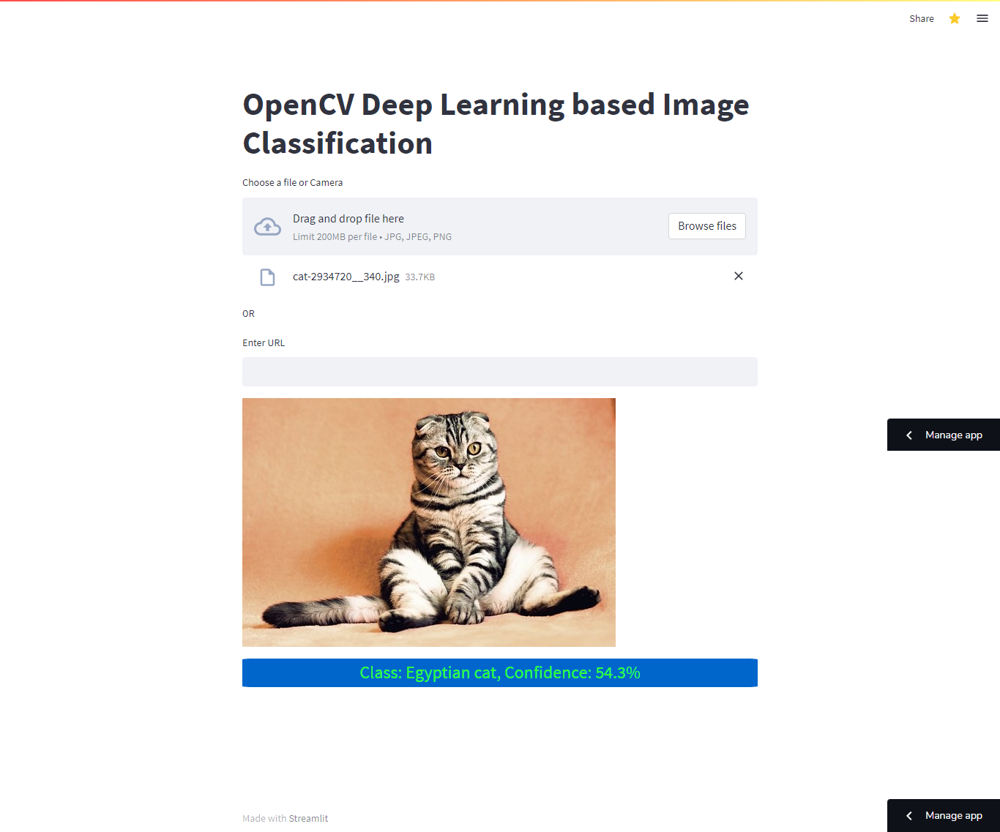

In [13]:
Image.open('/kaggle/input/watermark-fotos/screencapture-ahed-jneed-opencv-dnn-image-classification-streamlit-app-ukc9n1-streamlit-app-2023-01-04-10_12_44.png')

# Thank You

Thanks for viewing my Kernel!

* Please let me know if there is something else should I add to this mini-tutorial

* Comments about how to improve my Code will also be highly appreciated